In [ ]:
# ## 1. Setup: Import Required Libraries
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from scipy.interpolate import make_interp_spline
import os
from sklearn.manifold import MDS
from math import pi
from matplotlib import rcParams


Figure 2: Subplots Comparing Distance Metrics

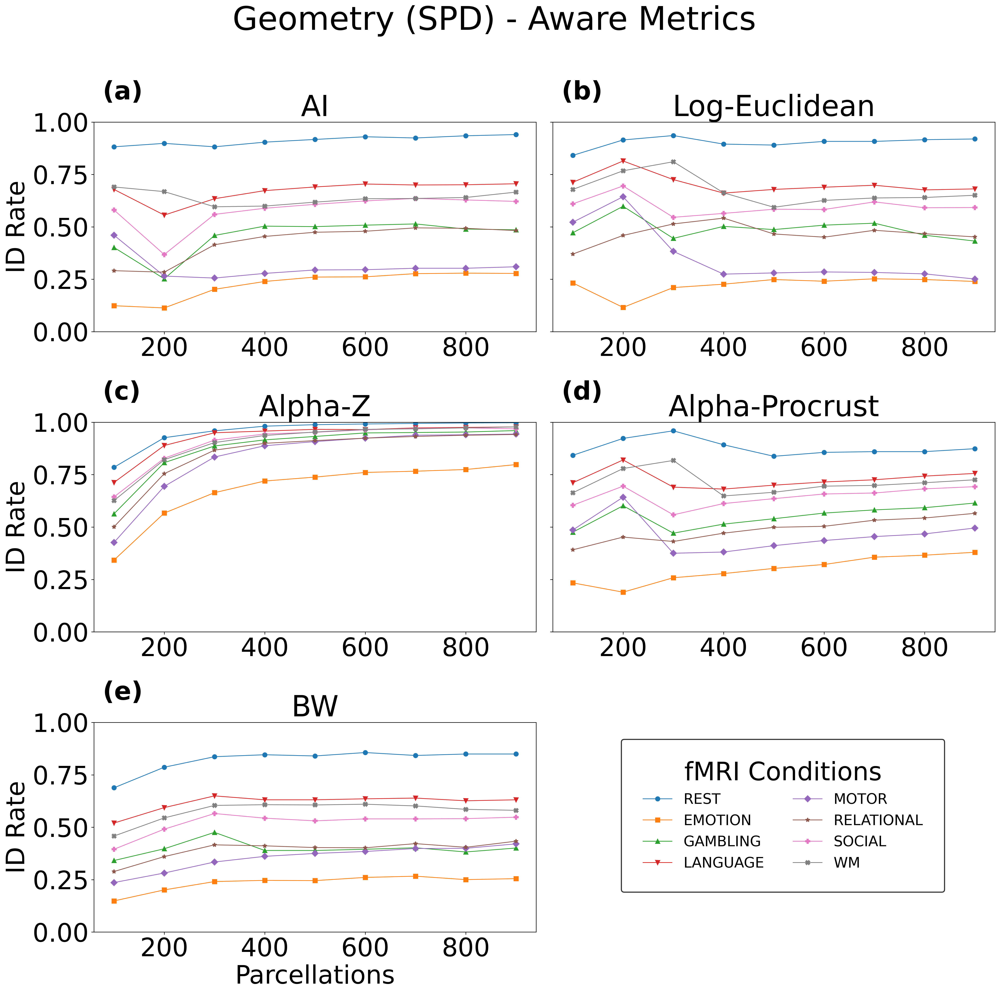

In [220]:
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.lines import Line2D
import numpy as np

# ──────────────────────────────────────────────────────────────────────────────
# 0. Your data dictionaries (as before)
# ──────────────────────────────────────────────────────────────────────────────
tau_values = [100, 200, 300, 400, 500, 600, 700, 800, 900]

tasks_ai_distance = {
    'REST':       [0.8820, 0.8984, 0.8820, 0.9042, 0.9171, 0.9299, 0.9241, 0.9346, 0.9404],
    'EMOTION':    [0.1238, 0.1133, 0.2021, 0.2395, 0.2605, 0.2617, 0.2769, 0.2792, 0.2780],
    'GAMBLING':   [0.4019, 0.2523, 0.4591, 0.5035, 0.5012, 0.5082, 0.5140, 0.4895, 0.4860],
    'LANGUAGE':   [0.6787, 0.5561, 0.6343, 0.6729, 0.6904, 0.7044, 0.6998, 0.7009, 0.7056],
    'MOTOR':      [0.4603, 0.2652, 0.2558, 0.2780, 0.2944, 0.2956, 0.3026, 0.3026, 0.3096],
    'RELATIONAL': [0.2909, 0.2839, 0.4147, 0.4544, 0.4743, 0.4790, 0.4953, 0.4930, 0.4825],
    'SOCIAL':     [0.5806, 0.3680, 0.5596, 0.5888, 0.6075, 0.6238, 0.6355, 0.6285, 0.6215],
    'WM':         [0.6904, 0.6682, 0.5958, 0.5993, 0.6180, 0.6343, 0.6355, 0.6402, 0.6659]
}

tasks_log_euclidean = {
    'REST':       [0.8411, 0.9147, 0.9357, 0.8949, 0.8902, 0.9077, 0.9077, 0.9159, 0.9194],
    'EMOTION':    [0.2325, 0.1157, 0.2105, 0.2266, 0.2488, 0.2406, 0.2523, 0.2488, 0.2395],
    'GAMBLING':   [0.4720, 0.5981, 0.4451, 0.5023, 0.4871, 0.5082, 0.5175, 0.4603, 0.4322],
    'LANGUAGE':   [0.7126, 0.8143, 0.7255, 0.6612, 0.6787, 0.6892, 0.6986, 0.6764, 0.6812],
    'MOTOR':      [0.5222, 0.6437, 0.3832, 0.2745, 0.2803, 0.2850, 0.2827, 0.2757, 0.2512],
    'RELATIONAL': [0.3703, 0.4591, 0.5140, 0.5417, 0.4661, 0.4509, 0.4836, 0.4673, 0.4521],
    'SOCIAL':     [0.6098, 0.6951, 0.5456, 0.5643, 0.5841, 0.5829, 0.6192, 0.5912, 0.5923],
    'WM':         [0.6787, 0.7675, 0.8107, 0.6624, 0.5935, 0.6262, 0.6379, 0.6402, 0.6507]
}

tasks_alpha_z = {
    'REST':       [0.7850, 0.9264, 0.9591, 0.9813, 0.9883, 0.9918, 0.9942, 0.9965, 0.9977],
    'EMOTION':    [0.3423, 0.5666, 0.6640, 0.7196, 0.7383, 0.7605, 0.7664, 0.7745, 0.7979],
    'GAMBLING':   [0.5631, 0.8072, 0.8867, 0.9159, 0.9322, 0.9490, 0.9509, 0.9533, 0.9603],
    'LANGUAGE':   [0.7126, 0.8890, 0.9498, 0.9579, 0.9661, 0.9650, 0.9731, 0.9755, 0.9778],
    'MOTOR':      [0.4264, 0.6939, 0.8341, 0.8879, 0.9077, 0.9241, 0.9381, 0.9404, 0.9439],
    'RELATIONAL': [0.5011, 0.7547, 0.8668, 0.8995, 0.9124, 0.9241, 0.9322, 0.9381, 0.9416],
    'SOCIAL':     [0.6437, 0.8283, 0.9147, 0.9439, 0.9521, 0.9638, 0.9708, 0.9731, 0.9685],
    'WM':         [0.6262, 0.8213, 0.9030, 0.9369, 0.9533, 0.9661, 0.9685, 0.9731, 0.9778]
}

tasks_alpha_procrust = {
    'REST':       [0.8423, 0.9229, 0.9591, 0.8925, 0.8376, 0.8563, 0.8598, 0.8598, 0.8738],
    'EMOTION':    [0.2336, 0.1893, 0.2582, 0.2780, 0.3026, 0.3213, 0.3563, 0.3657, 0.3797],
    'GAMBLING':   [0.4755, 0.6016, 0.4708, 0.5140, 0.5397, 0.5666, 0.5818, 0.5923, 0.6145],
    'LANGUAGE':   [0.7114, 0.8201, 0.6904, 0.6812, 0.6998, 0.7150, 0.7255, 0.7430, 0.7558],
    'MOTOR':      [0.4860, 0.6425, 0.3750, 0.3808, 0.4112, 0.4357, 0.4544, 0.4673, 0.4953],
    'RELATIONAL': [0.3914, 0.4521, 0.4311, 0.4708, 0.4988, 0.5035, 0.5327, 0.5432, 0.5654],
    'SOCIAL':     [0.6040, 0.6951, 0.5584, 0.6121, 0.6355, 0.6577, 0.6624, 0.6822, 0.6927],
    'WM':         [0.6636, 0.7792, 0.8177, 0.6484, 0.6659, 0.6951, 0.6986, 0.7114, 0.7255]
}

tasks_bw_distance = {
    'REST':       [0.6881, 0.7862, 0.8364, 0.8458, 0.8400, 0.8563, 0.8423, 0.8493, 0.8493],
    'EMOTION':    [0.1484, 0.2009, 0.2407, 0.2465, 0.2453, 0.2605, 0.2664, 0.25,   0.2547],
    'GAMBLING':   [0.3411, 0.3972, 0.4755, 0.3890, 0.3890, 0.3949, 0.4019, 0.3820, 0.4007],
    'LANGUAGE':   [0.5199, 0.5935, 0.6495, 0.6308, 0.6308, 0.6355, 0.6390, 0.6262, 0.6308],
    'MOTOR':      [0.2360, 0.2815, 0.3341, 0.3610, 0.3750, 0.3843, 0.3984, 0.3995, 0.4206],
    'RELATIONAL': [0.2886, 0.3598, 0.4159, 0.4112, 0.4030, 0.4019, 0.4217, 0.4042, 0.4334],
    'SOCIAL':     [0.3949, 0.4907, 0.5654, 0.5432, 0.5304, 0.5397, 0.5397, 0.5409, 0.5479],
    'WM':         [0.4579, 0.5444, 0.6040, 0.6075, 0.6063, 0.6098, 0.6016, 0.5853, 0.5806]
}

# ──────────────────────────────────────────────────────────────────────────────
# 1. rcParams, markers & panel letters
# ──────────────────────────────────────────────────────────────────────────────
mpl.rcParams.update({
    'font.size':       18,
    'axes.titlesize':  40,
    'axes.labelsize':  35,
    'xtick.labelsize': 35,
    'ytick.labelsize': 35,
    'legend.fontsize': 20
})

marker_styles = ['o', 's', '^', 'v', 'D', '*', 'P', 'X']
panel_letters = ['a', 'b', 'c', 'd', 'e']  # for the five real plots

# ──────────────────────────────────────────────────────────────────────────────
# 2. Create 3×2 grid, leave bottom‐right empty
# ──────────────────────────────────────────────────────────────────────────────
fig, axs = plt.subplots(3, 2, figsize=(22, 20), dpi=300)
fig.patch.set_facecolor('white')

plot_data = [
    (tasks_ai_distance,    'AI'),
    (tasks_log_euclidean,  'Log-Euclidean'),
    (tasks_alpha_z,        'Alpha-Z'),
    (tasks_alpha_procrust, 'Alpha-Procrust'),
    (tasks_bw_distance,    'BW')
]

# ──────────────────────────────────────────────────────────────────────────────
# 3. Plot each panel, label panels, and remove y‐ticks for (b) & (d)
# ──────────────────────────────────────────────────────────────────────────────
for i, (task_dict, title) in enumerate(plot_data):
    row, col = divmod(i, 2)
    ax = axs[row, col]
    ax.set_facecolor('white')

    # Plot each condition
    for j, (cond, vals) in enumerate(task_dict.items()):
        mk = marker_styles[j % len(marker_styles)]
        ax.plot(tau_values, vals,
                marker=mk,
                label=cond,
                linewidth=1)

    # Titles & axes
    ax.set_title(title)
    ax.set_ylim(0, 1)
    if row == 2:
        ax.set_xlabel('Parcellations')
    if col == 0:
        ax.set_ylabel('ID Rate')

    # Remove y‐tick labels for panels b (i==1) and d (i==3)
    if i in (1, 3):
        ax.tick_params(labelleft=False)
        # optionally also remove the left spine tick marks:
        # ax.yaxis.set_ticks_position('none')

    # Add the panel letter
    ax.text(
        0.02, 1.2,
        f'({panel_letters[i]})',
        transform=ax.transAxes,
        fontsize=35,
        fontweight='bold',
        va='top',
        ha='left'
    )

# Remove the bottom‐right empty subplot
fig.delaxes(axs[2, 1])

# ──────────────────────────────────────────────────────────────────────────────
# 4. Combined legend on bottom right
# ──────────────────────────────────────────────────────────────────────────────
handles, labels = axs[1, 1].get_legend_handles_labels()
legend = fig.legend(
    handles, labels,
    loc='center right',
    title="fMRI Conditions",
    ncol=2,
    bbox_to_anchor=(0.90, 0.18),
    frameon=True,
    borderpad=1.5,
    fontsize=20,
    title_fontsize=35
)
legend.get_frame().set_edgecolor('black')
legend.get_frame().set_linewidth(1.5)
legend.get_frame().set_facecolor('white')

# ──────────────────────────────────────────────────────────────────────────────
# 5. Super‐title, layout & save
# ──────────────────────────────────────────────────────────────────────────────
fig.suptitle('Geometry (SPD) - Aware Metrics', fontsize=45, y=0.96)
plt.tight_layout(rect=[0.06, 0, 0.95, 0.95])

fig.savefig("D:/Research AU/figure2.pdf", bbox_inches='tight')
fig.savefig("D:/Research AU/figure2.svg", bbox_inches='tight')
plt.show()


# ## 3. Figure 3: Task-wise ID Rate across Parcellations



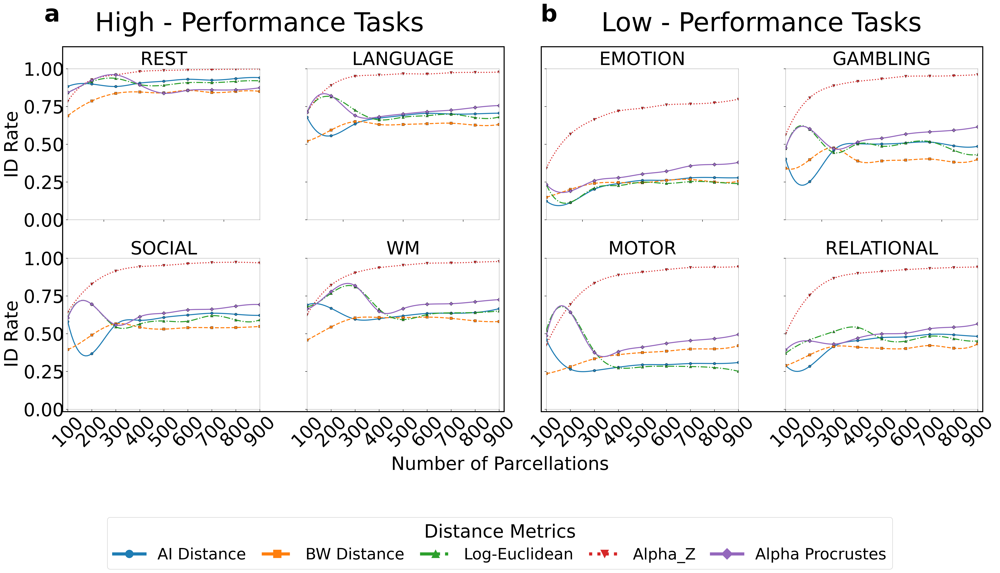

In [128]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.lines import Line2D
from scipy.interpolate import make_interp_spline
import matplotlib as mpl
from matplotlib.patches import Rectangle

# --------------------------------------------------------------------
# 1. Define your data (High‐ and Low‐Performance tasks)
# --------------------------------------------------------------------
parcellations = [100, 200, 300, 400, 500, 600, 700, 800, 900]

# High‐Performance Tasks (4 subplots: REST, LANGUAGE, SOCIAL, WM)
tasks_data_page_1 = [
    {
        'AI Distance':     [0.8820, 0.8984, 0.8820, 0.9042, 0.9171, 0.9299, 0.9241, 0.9346, 0.9404],
        'BW Distance':     [0.6881, 0.7862, 0.8364, 0.8458, 0.8400, 0.8563, 0.8423, 0.8493, 0.8493],
        'Log‐Euclidean':   [0.8411, 0.9147, 0.9357, 0.8949, 0.8902, 0.9077, 0.9077, 0.9159, 0.9194],
        'Alpha_Z':         [0.7850, 0.9264, 0.9591, 0.9813, 0.9883, 0.9918, 0.9942, 0.9965, 0.9977],
        'Alpha Procrustes':[0.8423, 0.9229, 0.9591, 0.8925, 0.8376, 0.8563, 0.8598, 0.8598, 0.8738]
    },
    {
        'AI Distance':     [0.6787, 0.5561, 0.6343, 0.6729, 0.6904, 0.7044, 0.6998, 0.7009, 0.7056],
        'BW Distance':     [0.5199, 0.5935, 0.6495, 0.6308, 0.6308, 0.6355, 0.6390, 0.6262, 0.6308],
        'Log‐Euclidean':   [0.7126, 0.8143, 0.7255, 0.6612, 0.6787, 0.6892, 0.6986, 0.6764, 0.6810],
        'Alpha_Z':         [0.7126, 0.8890, 0.9498, 0.9579, 0.9661, 0.9650, 0.9731, 0.9755, 0.9778],
        'Alpha Procrustes':[0.7114, 0.8201, 0.6904, 0.6812, 0.6998, 0.7150, 0.7255, 0.7430, 0.7558]
    },
    {
        'AI Distance':     [0.5806, 0.3680, 0.5596, 0.5888, 0.6075, 0.6238, 0.6355, 0.6285, 0.6215],
        'BW Distance':     [0.3949, 0.4907, 0.5654, 0.5432, 0.5304, 0.5397, 0.5397, 0.5409, 0.5479],
        'Log‐Euclidean':   [0.6098, 0.6951, 0.5456, 0.5643, 0.5841, 0.5829, 0.6192, 0.5912, 0.5923],
        'Alpha_Z':         [0.6437, 0.8283, 0.9147, 0.9439, 0.9521, 0.9638, 0.9708, 0.9731, 0.9685],
        'Alpha Procrustes':[0.6040, 0.6951, 0.5584, 0.6121, 0.6355, 0.6577, 0.6624, 0.6822, 0.6927]
    },
    {
        'AI Distance':     [0.6904, 0.6682, 0.5958, 0.5993, 0.6180, 0.6343, 0.6355, 0.6402, 0.6659],
        'BW Distance':     [0.4579, 0.5444, 0.6040, 0.6075, 0.6063, 0.6098, 0.6016, 0.5853, 0.5806],
        'Log‐Euclidean':   [0.6787, 0.7675, 0.8107, 0.6624, 0.5935, 0.6262, 0.6379, 0.6402, 0.6507],
        'Alpha_Z':         [0.6262, 0.8213, 0.9030, 0.9369, 0.9533, 0.9661, 0.9685, 0.9731, 0.9778],
        'Alpha Procrustes':[0.6636, 0.7792, 0.8177, 0.6484, 0.6659, 0.6951, 0.6986, 0.7114, 0.7255]
    }
]
titles_page_1 = ['REST', 'LANGUAGE', 'SOCIAL', 'WM']

# Low‐Performance Tasks (4 subplots: EMOTION, GAMBLING, MOTOR, RELATIONAL)
tasks_data_page_2 = [
    {
        'AI Distance':     [0.1238, 0.1133, 0.2021, 0.2395, 0.2605, 0.2617, 0.2769, 0.2792, 0.2780],
        'BW Distance':     [0.1484, 0.2009, 0.2407, 0.2465, 0.2453, 0.2605, 0.2664, 0.2500, 0.2547],
        'Log‐Euclidean':   [0.2325, 0.1157, 0.2105, 0.2266, 0.2488, 0.2406, 0.2523, 0.2488, 0.2395],
        'Alpha_Z':         [0.3423, 0.5666, 0.6640, 0.7196, 0.7383, 0.7605, 0.7664, 0.7745, 0.7979],
        'Alpha Procrustes':[0.2336, 0.1893, 0.2582, 0.2780, 0.3026, 0.3213, 0.3563, 0.3657, 0.3797]
    },
    {
        'AI Distance':     [0.4019, 0.2523, 0.4591, 0.5035, 0.5012, 0.5082, 0.5140, 0.4895, 0.4860],
        'BW Distance':     [0.3411, 0.3972, 0.4755, 0.3890, 0.3890, 0.3949, 0.4019, 0.3820, 0.4007],
        'Log‐Euclidean':   [0.4720, 0.5981, 0.4451, 0.5023, 0.4871, 0.5082, 0.5175, 0.4603, 0.4322],
        'Alpha_Z':         [0.5631, 0.8072, 0.8867, 0.9159, 0.9322, 0.9490, 0.9509, 0.9533, 0.9603],
        'Alpha Procrustes':[0.4755, 0.6016, 0.4708, 0.5140, 0.5397, 0.5666, 0.5818, 0.5923, 0.6145]
    },
    {
        'AI Distance':     [0.4603, 0.2652, 0.2558, 0.2780, 0.2944, 0.2956, 0.3026, 0.3026, 0.3095],
        'BW Distance':     [0.2360, 0.2815, 0.3341, 0.3610, 0.3750, 0.3843, 0.3984, 0.3995, 0.4206],
        'Log‐Euclidean':   [0.5222, 0.6437, 0.3832, 0.2745, 0.2803, 0.2850, 0.2827, 0.2757, 0.2512],
        'Alpha_Z':         [0.4264, 0.6939, 0.8341, 0.8879, 0.9077, 0.9241, 0.9381, 0.9404, 0.9439],
        'Alpha Procrustes':[0.4860, 0.6425, 0.3750, 0.3808, 0.4112, 0.4357, 0.4544, 0.4673, 0.4953]
    },
    {
        'AI Distance':     [0.2909, 0.2839, 0.4147, 0.4544, 0.4743, 0.4790, 0.4953, 0.4930, 0.4825],
        'BW Distance':     [0.2886, 0.3598, 0.4159, 0.4112, 0.4030, 0.4019, 0.4217, 0.4042, 0.4334],
        'Log‐Euclidean':   [0.3703, 0.4591, 0.5140, 0.5417, 0.4661, 0.4509, 0.4836, 0.4673, 0.4521],
        'Alpha_Z':         [0.5011, 0.7547, 0.8668, 0.8995, 0.9124, 0.9241, 0.9322, 0.9381, 0.9416],
        'Alpha Procrustes':[0.3914, 0.4521, 0.4311, 0.4708, 0.4988, 0.5035, 0.5327, 0.5432, 0.5654]
    }
]
titles_page_2 = ['EMOTION', 'GAMBLING', 'MOTOR', 'RELATIONAL']

# --------------------------------------------------------------------
# 2. Set up a 2×4 grid of subplots and configure styling
# --------------------------------------------------------------------
mpl.rcParams.update({
    'font.size':       18,
    'axes.titlesize':  35,
    'axes.labelsize':  35,
    'xtick.labelsize': 35,
    'ytick.labelsize': 35,
    'legend.fontsize': 35
})

fig, axs = plt.subplots(2, 4, figsize=(27, 13), dpi=300)
fig.patch.set_facecolor('white')

# Color/marker/linestyle definitions for the five distance metrics
colors     = ["#1f7db4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd"]
markers    = ['o', 's', '^', 'v', 'D']
linestyles = ['-', '--', '-.', ':', '-']
distance_labels = list(tasks_data_page_1[0].keys())

# We'll build a dictionary of one sample Line2D per distance metric for the shared legend
sample_lines = {
    dist: Line2D(
        [0], [0],
        color=colors[i],
        marker=markers[i],
        linestyle=linestyles[i],
        markersize=15,   # (optional) make the marker a bit bigger, too
        linewidth=6,   # ← thickness of the legend line
        label=dist
    )
    for i, dist in enumerate(distance_labels)
}

# --------------------------------------------------------------------
# 3. Plot High‐Performance tasks (left 2×2 block: columns 0–1)
# --------------------------------------------------------------------
for idx, (data_dict, title) in enumerate(zip(tasks_data_page_1, titles_page_1)):
    row = idx // 2
    col = idx % 2
    ax  = axs[row, col]
    
    for i, dist in enumerate(distance_labels):
        x = np.array(parcellations)
        y = np.array(data_dict[dist])
        
        # If ≥4 points, smooth with a spline
        if len(x) >= 4:
            x_smooth = np.linspace(x.min(), x.max(), 100)
            y_smooth = make_interp_spline(x, y, k=3)(x_smooth)
        else:
            x_smooth, y_smooth = x, y
        
        ax.plot(
            x_smooth, y_smooth,
            color=colors[i],
            linestyle=linestyles[i],
            linewidth=2,
            zorder=1  # ensure it's drawn above any borders added later
        )
        ax.scatter(
            x, y,
            color=colors[i],
            edgecolor='black',
            linewidth=0.4,
            marker=markers[i],
            s=25,
            zorder=2
        )
        
        # Record one sample Line2D for the legend
        if dist not in sample_lines:
            sample_lines[dist] = Line2D(
                [0], [0],
                color=colors[i],
                marker=markers[i],
                linestyle=linestyles[i],
                markersize=5,
                linewidth=2,
                label=dist
            )
    
    ax.set_title(title)
    ax.set_ylim(0, 1)
    ax.set_xlim(min(parcellations), max(parcellations))
    
    # Only bottom row shows x‐tick labels
    if row == 1:
        ax.set_xticks(parcellations)
        ax.set_xticklabels(parcellations, rotation=45)
    else:
        ax.set_xticklabels([])
    
    # Only left‐column subplots show a y‐axis label
    if col == 0:
        ax.set_ylabel("ID Rate")
    else:
        ax.set_yticklabels([])
    
    # Lighten the spines
    for spine in ax.spines.values():
        spine.set_alpha(0.3)

# --------------------------------------------------------------------
# 4. Plot Low‐Performance tasks (right 2×2 block: columns 2–3)
# --------------------------------------------------------------------
for idx, (data_dict, title) in enumerate(zip(tasks_data_page_2, titles_page_2)):
    row = idx // 2
    col = (idx % 2) + 2
    ax  = axs[row, col]
    
    for i, dist in enumerate(distance_labels):
        x = np.array(parcellations)
        y = np.array(data_dict[dist])
        
        if len(x) >= 4:
            x_smooth = np.linspace(x.min(), x.max(), 100)
            y_smooth = make_interp_spline(x, y, k=3)(x_smooth)
        else:
            x_smooth, y_smooth = x, y
        
        ax.plot(
            x_smooth, y_smooth,
            color=colors[i],
            linestyle=linestyles[i],
            linewidth=2,
            zorder=1
        )
        ax.scatter(
            x, y,
            color=colors[i],
            edgecolor='black',
            linewidth=0.4,
            marker=markers[i],
            s=25,
            zorder=2
        )
    
    ax.set_title(title)
    ax.set_ylim(0, 1)
    ax.set_xlim(min(parcellations), max(parcellations))
    
    if row == 1:
        ax.set_xticks(parcellations)
        ax.set_xticklabels(parcellations, rotation=45)
    else:
        ax.set_xticklabels([])
    
    ax.set_yticklabels([])
    for spine in ax.spines.values():
        spine.set_alpha(0.3)

# --------------------------------------------------------------------
# 5. Run tight_layout and force a draw so that each Axes’ position is finalized
# --------------------------------------------------------------------
plt.tight_layout(rect=[0, 0.04, 1, 0.90])
fig.canvas.draw()   # Force a render so that get_position() returns the final tight positions

# --------------------------------------------------------------------
# 6. Compute bounding boxes (figure‐fraction coords) for each 2×2 block
# --------------------------------------------------------------------
def get_axes_bbox_in_fig(ax_list):
    """
    Given a list of Axes, return [x0, y0, x1, y1] in figure‐fraction coordinates
    that fully encloses them all.
    """
    x0, y0 = +np.inf, +np.inf
    x1, y1 = -np.inf, -np.inf
    
    for ax in ax_list:
        pos = ax.get_position()  # this is in figure-fraction coordinates
        x0 = min(x0, pos.x0)
        y0 = min(y0, pos.y0)
        x1 = max(x1, pos.x1)
        y1 = max(y1, pos.y1)
    
    return [x0, y0, x1, y1]

# Left block (panel a): axs[0,0], axs[0,1], axs[1,0], axs[1,1]
left_axes = [axs[0,0], axs[0,1], axs[1,0], axs[1,1]]
lx0, ly0, lx1, ly1 = get_axes_bbox_in_fig(left_axes)

# Right block (panel b): axs[0,2], axs[0,3], axs[1,2], axs[1,3]
right_axes = [axs[0,2], axs[0,3], axs[1,2], axs[1,3]]
rx0, ry0, rx1, ry1 = get_axes_bbox_in_fig(right_axes)

# --------------------------------------------------------------------
# 7. Draw thick border rectangles around each block
# --------------------------------------------------------------------
pad = 0.005  # small padding around the block (in figure‐fraction units)

# Rectangle for panel a (High Performance)
panel_a_box = Rectangle(
    (lx0 - pad, ly0 - pad),
    (lx1 - lx0) + 2 * pad,
    (ly1 - ly0) + 10 * pad,
    transform=fig.transFigure,
    facecolor='none',
    edgecolor='black',
    linewidth=2.0,
    zorder=10
)
fig.add_artist(panel_a_box)

# Rectangle for panel b (Low Performance)
panel_b_box = Rectangle(
    (rx0 - pad, ry0 - pad),
    (rx1 - rx0) + 2 * pad,
    (ry1 - ry0) + 10* pad,
    transform=fig.transFigure,
    facecolor='none',
    edgecolor='black',
    linewidth=2.0,
    zorder=10
)
fig.add_artist(panel_b_box)

# --------------------------------------------------------------------
# 8. Add shared text labels (a/b, titles, axes) and the bottom‐center legend
# --------------------------------------------------------------------
# Shared X‐axis label
fig.text(0.5, 0.02, "Number of Parcellations", ha="center", fontsize=35)

# Panel labels and group titles
fig.text(0.05, 0.94, "a", fontsize=45, weight="bold")
fig.text(0.1, 0.92, "High - Performance Tasks", fontsize=50)
fig.text(0.54, 0.94, "b", fontsize=45, weight="bold")
fig.text(0.6, 0.92, "Low - Performance Tasks", fontsize=50)

# Shared legend at the bottom
fig.legend(
    handles=list(sample_lines.values()),
    labels=list(sample_lines.keys()),
    loc="lower center",
    ncol=5,
    bbox_to_anchor=(0.5, -0.2),
    title='Distance Metrics',
    title_fontsize=35,
    fontsize=30,
    frameon=True,
    handlelength=2,
    handletextpad=.8,
    columnspacing=1.0,
    labelspacing=.4
)

# --------------------------------------------------------------------
# 9. Save & display
# --------------------------------------------------------------------
fig.savefig("D:/Research AU/figure3a.pdf", bbox_inches='tight')
fig.savefig("D:/Research AU/figure3a.svg", bbox_inches='tight')
plt.show()



 Figure 4: 3x3 Grid Bar Plot for Impact of Granularity

<function matplotlib.pyplot.show(close=None, block=None)>

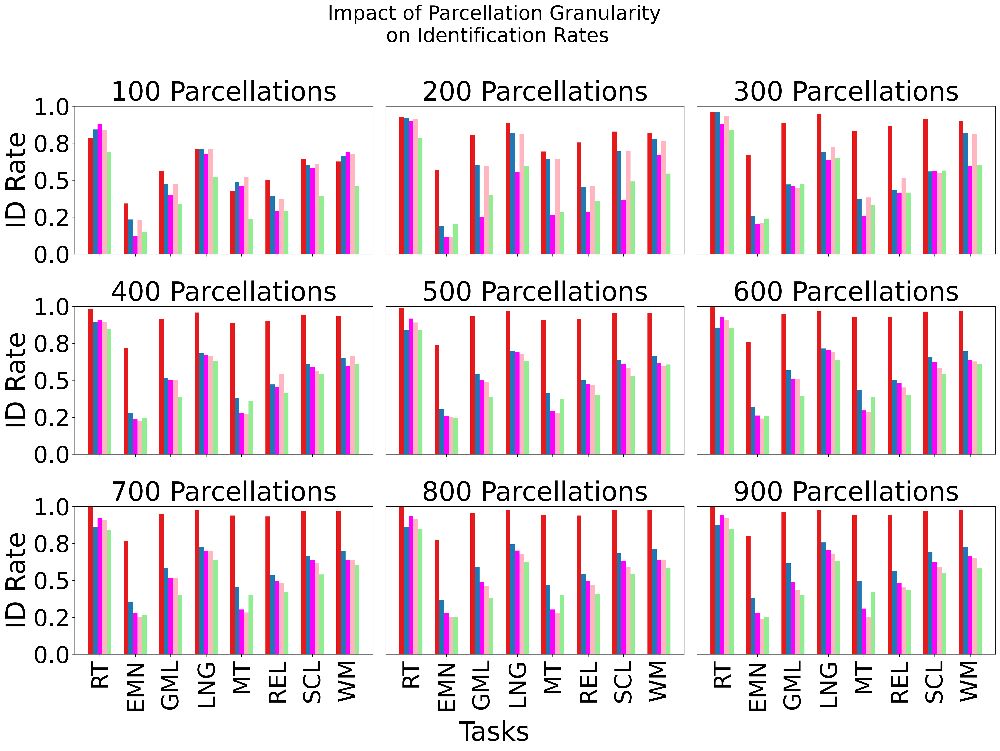

In [288]:
#figure4(a)..
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl

# All parcellation-level data
data = [
    {'AI': [0.8820, 0.1238, 0.4019, 0.6787, 0.4603, 0.2909, 0.5806, 0.6904],
     'BW': [0.6881, 0.1484, 0.3411, 0.5199, 0.2360, 0.2886, 0.3949, 0.4579],
     'Log-Euclidean': [0.8411, 0.2325, 0.4720, 0.7126, 0.5222, 0.3703, 0.6098, 0.6787],
     'Alpha Z': [0.7850, 0.3423, 0.5631, 0.7126, 0.4264, 0.5012, 0.6437, 0.6262],
     'Alpha Procrustes': [0.8423, 0.2336, 0.4755, 0.7114, 0.4860, 0.3914, 0.6040, 0.6636]},
    {'AI': [0.8984, 0.1133, 0.2523, 0.5561, 0.2652, 0.2839, 0.3680, 0.6682],
     'BW': [0.7862, 0.2009, 0.3972, 0.5935, 0.2815, 0.3598, 0.4907, 0.5444],
     'Log-Euclidean': [0.9147, 0.1157, 0.5981, 0.8143, 0.6437, 0.4591, 0.6951, 0.7675],
     'Alpha Z': [0.9264, 0.5666, 0.8072, 0.8890, 0.6939, 0.7547, 0.8283, 0.8213],
     'Alpha Procrustes': [0.9229, 0.1893, 0.6016, 0.8201, 0.6425, 0.4521, 0.6951, 0.7792]},
    {'AI': [0.8820, 0.2021, 0.4591, 0.6343, 0.2558, 0.4147, 0.5596, 0.5958],
     'BW': [0.8364, 0.2407, 0.4755, 0.6495, 0.3341, 0.4159, 0.5654, 0.6040],
     'Log-Euclidean': [0.9357, 0.2105, 0.4451, 0.7255, 0.3832, 0.5140, 0.5456, 0.8107],
     'Alpha Z': [0.9591, 0.6694, 0.8867, 0.9498, 0.8341, 0.8668, 0.9147, 0.9030],
     'Alpha Procrustes': [0.9591, 0.2582, 0.4708, 0.6904, 0.3750, 0.4311, 0.5584, 0.8177]},
    {'AI': [0.9042, 0.2395, 0.5035, 0.6729, 0.2780, 0.4544, 0.5888, 0.5993],
     'BW': [0.8458, 0.2465, 0.3890, 0.6308, 0.3610, 0.4112, 0.5432, 0.6075],
     'Log-Euclidean': [0.8949, 0.2266, 0.5023, 0.6612, 0.2745, 0.5417, 0.5643, 0.6624],
     'Alpha Z': [0.9813, 0.7196, 0.9159, 0.9579, 0.8879, 0.8995, 0.9439, 0.9369],
     'Alpha Procrustes': [0.8925, 0.2780, 0.5140, 0.6811, 0.3808, 0.4708, 0.6121, 0.6484]},
    {'AI': [0.9171, 0.2605, 0.5012, 0.6904, 0.2944, 0.4743, 0.6075, 0.6180],
     'BW': [0.8400, 0.2453, 0.3890, 0.6308, 0.3750, 0.4030, 0.5304, 0.6063],
     'Log-Euclidean': [0.8902, 0.2488, 0.4871, 0.6787, 0.2803, 0.4661, 0.5841, 0.5935],
     'Alpha Z': [0.9883, 0.7383, 0.9322, 0.9661, 0.9077, 0.9124, 0.9521, 0.9533],
     'Alpha Procrustes': [0.8376, 0.3026, 0.5397, 0.6998, 0.4112, 0.4988, 0.6355, 0.6659]},
    {'AI': [0.9299, 0.2617, 0.5082, 0.7044, 0.2956, 0.4790, 0.6238, 0.6343],
     'BW': [0.8563, 0.2605, 0.3949, 0.6355, 0.3843, 0.4019, 0.5397, 0.6098],
     'Log-Euclidean': [0.9077, 0.2406, 0.5082, 0.6892, 0.2850, 0.4509, 0.5829, 0.6262],
     'Alpha Z': [0.9918, 0.7605, 0.9486, 0.9650, 0.9241, 0.9241, 0.9638, 0.9661],
     'Alpha Procrustes': [0.8563, 0.3213, 0.5666, 0.7150, 0.4357, 0.5035, 0.6577, 0.6951]},
    {'AI': [0.9241, 0.2769, 0.5140, 0.6998, 0.3026, 0.4953, 0.6355, 0.6355],
     'BW': [0.8423, 0.2664, 0.4019, 0.6390, 0.3984, 0.4217, 0.5397, 0.6016],
     'Log-Euclidean': [0.9077, 0.2523, 0.5175, 0.6986, 0.2827, 0.4836, 0.6192, 0.6379],
     'Alpha Z': [0.9942, 0.7664, 0.9509, 0.9731, 0.9381, 0.9322, 0.9708, 0.9685],
     'Alpha Procrustes': [0.8598, 0.3563, 0.5818, 0.7255, 0.4544, 0.5327, 0.6624, 0.6986]},
    {'AI': [0.9346, 0.2792, 0.4895, 0.7009, 0.3026, 0.4930, 0.6285, 0.6402],
     'BW': [0.8493, 0.2500, 0.3820, 0.6262, 0.3995, 0.4042, 0.5409, 0.5853],
     'Log-Euclidean': [0.9159, 0.2488, 0.4603, 0.6764, 0.2757, 0.4673, 0.5912, 0.6402],
     'Alpha Z': [0.9965, 0.7745, 0.9533, 0.9755, 0.9404, 0.9381, 0.9731, 0.9731],
     'Alpha Procrustes': [0.8598, 0.3657, 0.5923, 0.7430, 0.4673, 0.5432, 0.6822, 0.7114]},
    {'AI': [0.9404, 0.2780, 0.4860, 0.7056, 0.3095, 0.4825, 0.6215, 0.6659],
     'BW': [0.8493, 0.2547, 0.4007, 0.6308, 0.4206, 0.4334, 0.5479, 0.5806],
     'Log-Euclidean': [0.9194, 0.2395, 0.4322, 0.6810, 0.2512, 0.4521, 0.5923, 0.6507],
     'Alpha Z': [0.9977, 0.7979, 0.9603, 0.9778, 0.9439, 0.9416, 0.9685, 0.9778],
     'Alpha Procrustes': [0.8738, 0.3797, 0.6145, 0.7558, 0.4953, 0.5654, 0.6928, 0.7255]}
]

# ---- STYLE SETTINGS ----
mpl.rcParams.update({
    'font.size':       18,
    'axes.titlesize':  40,
    'axes.labelsize':  40,
    'xtick.labelsize': 35,
    'ytick.labelsize': 35,
    'legend.fontsize': 20
})

# ---- PARAMETERS ----
tasks = ['RT', 'EMN', 'GML', 'LNG', 'MT', 'REL', 'SCL', 'WM']
methods = ['Alpha Z', 'Alpha Procrustes', 'AI', 'Log-Euclidean', 'BW']
titles = [
    '100 Parcellations', '200 Parcellations', '300 Parcellations',
    '400 Parcellations', '500 Parcellations', '600 Parcellations',
    '700 Parcellations', '800 Parcellations', '900 Parcellations'
]
colors = ['#e41a1c', '#1f77b4', '#ff00ff', '#FFB6C1', '#90EE90']
#colors  = ['#66c2a5', '#fc8d62', '#8da0cb', '#e78ac3', '#a6d854']


# ---- FIGURE SETUP ----
fig, axs = plt.subplots(3, 3, figsize=(24, 18), dpi=300)
axs = axs.flatten()
fig.patch.set_facecolor('white')

bar_width = 0.13
x = np.arange(len(tasks))  # 8 tasks

# ---- PLOT ----
for idx, ax in enumerate(axs):
    for i, method in enumerate(methods):
        values = data[idx][method]
        ax.bar(x + i * bar_width, values, width=bar_width, color=colors[i],
               label=method if idx == 0 else "")

    ax.set_title(titles[idx])

    ax.set_xticks(x + bar_width * 2)
    if idx >= 6:
        ax.set_xticklabels(tasks, rotation=90, ha='center')
    else:
        ax.set_xticklabels([])

    if idx % 3 == 0:
        ax.set_ylabel("ID Rate")
        ax.set_yticks(np.linspace(0, 1, 5))
        ax.set_yticklabels([f"{v:.1f}" for v in np.linspace(0, 1, 5)])
    else:
        ax.set_yticks([])

    ax.set_ylim(0, 1)
    ax.tick_params(axis='both')

# ---- MAIN TITLE ----
fig.suptitle("Impact of Parcellation Granularity\n on Identification Rates",fontsize=30, y=0.96)

# ---- XLABEL (ABOVE LEGEND!) ----
fig.text(0.5, 0.10, 'Tasks', ha='center', fontsize=40)  # moved up to stay above the legend



# ---- FINAL LAYOUT ----
plt.tight_layout(rect=[0.06, 0.12, .95, 0.95])  # leave more space at bottom
fig.savefig("D:/Research AU/figure4a.pdf", bbox_inches='tight')
fig.savefig("D:/Research AU/figure4a.svg", bbox_inches='tight')
plt.show

In [ ]:


legend = fig.legend(
    methods,
    loc='center right',              # put the legend in the middle of the right side
    bbox_to_anchor=(0.98, 0.5),      # slightly inset from the right edge
    ncol=1,                          # one column so it’s vertical
    fontsize=20,
    title='Distance Metrics',
    title_fontsize=30,
    frameon=True,
)
legend.get_frame().set_facecolor('white')
legend.get_frame().set_edgecolor('black')
legend.get_frame().set_linewidth(0.8)

# figure 4(b)

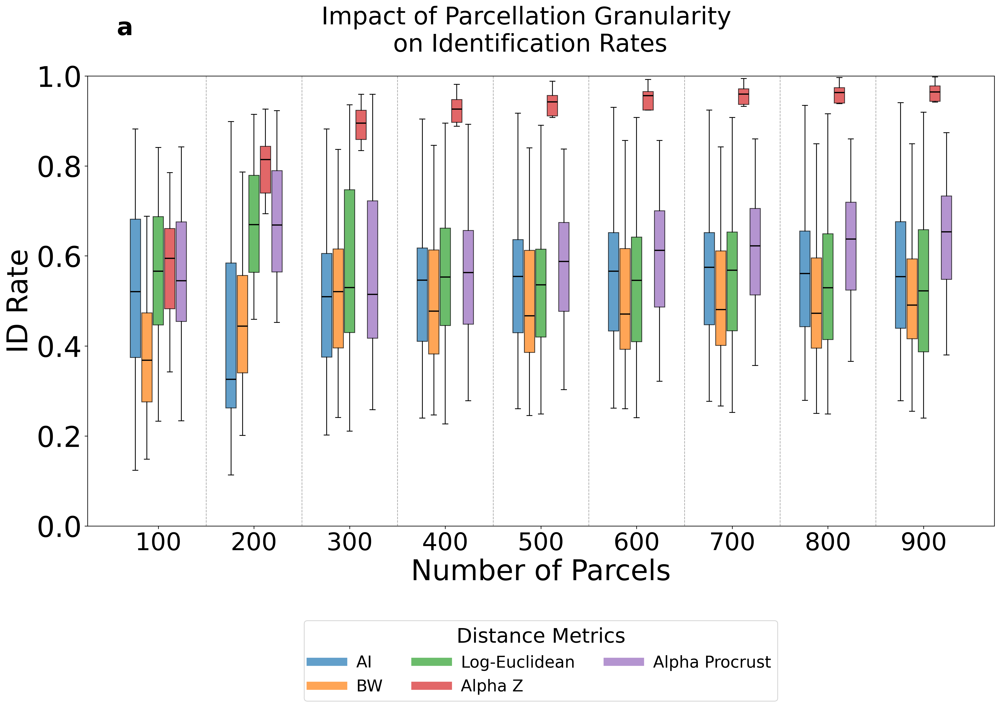

In [32]:
import matplotlib.pyplot as plt
import numpy as np

# ------------------------------------------------------------------------
# 1. RAW ID‐RATE DATA (same as before)
# ------------------------------------------------------------------------
data = [
    {'AI': [0.8820, 0.1238, 0.4019, 0.6787, 0.4603, 0.2909, 0.5806, 0.6904],
     'BW': [0.6881, 0.1484, 0.3411, 0.5199, 0.2360, 0.2886, 0.3949, 0.4579],
     'Log-Euclidean': [0.8411, 0.2325, 0.4720, 0.7126, 0.5222, 0.3703, 0.6098, 0.6787],
     'Alpha Z': [0.7850, 0.3423, 0.5631, 0.7126, 0.4264, 0.5012, 0.6437, 0.6262],
     'Alpha Procrust': [0.8423, 0.2336, 0.4755, 0.7114, 0.4860, 0.3914, 0.6040, 0.6636]},
    {'AI': [0.8984, 0.1133, 0.2523, 0.5561, 0.2652, 0.2839, 0.3680, 0.6682],
     'BW': [0.7862, 0.2009, 0.3972, 0.5935, 0.2815, 0.3598, 0.4907, 0.5444],
     'Log-Euclidean': [0.9147, 0.1157, 0.5981, 0.8143, 0.6437, 0.4591, 0.6951, 0.7675],
     'Alpha Z': [0.9264, 0.5666, 0.8072, 0.8890, 0.6939, 0.7547, 0.8283, 0.8213],
     'Alpha Procrust': [0.9229, 0.1893, 0.6016, 0.8201, 0.6425, 0.4521, 0.6951, 0.7792]},
    {'AI': [0.8820, 0.2021, 0.4591, 0.6343, 0.2558, 0.4147, 0.5596, 0.5958],
     'BW': [0.8364, 0.2407, 0.4755, 0.6495, 0.3341, 0.4159, 0.5654, 0.6040],
     'Log-Euclidean': [0.9357, 0.2105, 0.4451, 0.7255, 0.3832, 0.5140, 0.5456, 0.8107],
     'Alpha Z': [0.9591, 0.6694, 0.8867, 0.9498, 0.8341, 0.8668, 0.9147, 0.9030],
     'Alpha Procrust': [0.9591, 0.2582, 0.4708, 0.6904, 0.3750, 0.4311, 0.5584, 0.8177]},
    {'AI': [0.9042, 0.2395, 0.5035, 0.6729, 0.2780, 0.4544, 0.5888, 0.5993],
     'BW': [0.8458, 0.2465, 0.3890, 0.6308, 0.3610, 0.4112, 0.5432, 0.6075],
     'Log-Euclidean': [0.8949, 0.2266, 0.5023, 0.6612, 0.2745, 0.5417, 0.5643, 0.6624],
     'Alpha Z': [0.9813, 0.7196, 0.9159, 0.9579, 0.8879, 0.8995, 0.9439, 0.9369],
     'Alpha Procrust': [0.8925, 0.2780, 0.5140, 0.6811, 0.3808, 0.4708, 0.6121, 0.6484]},
    {'AI': [0.9171, 0.2605, 0.5012, 0.6904, 0.2944, 0.4743, 0.6075, 0.6180],
     'BW': [0.8400, 0.2453, 0.3890, 0.6308, 0.3750, 0.4030, 0.5304, 0.6063],
     'Log-Euclidean': [0.8902, 0.2488, 0.4871, 0.6787, 0.2803, 0.4661, 0.5841, 0.5935],
     'Alpha Z': [0.9883, 0.7383, 0.9322, 0.9661, 0.9077, 0.9124, 0.9521, 0.9533],
     'Alpha Procrust': [0.8376, 0.3026, 0.5397, 0.6998, 0.4112, 0.4988, 0.6355, 0.6659]},
    {'AI': [0.9299, 0.2617, 0.5082, 0.7044, 0.2956, 0.4790, 0.6238, 0.6343],
     'BW': [0.8563, 0.2605, 0.3949, 0.6355, 0.3843, 0.4019, 0.5397, 0.6098],
     'Log-Euclidean': [0.9077, 0.2406, 0.5082, 0.6892, 0.2850, 0.4509, 0.5829, 0.6262],
     'Alpha Z': [0.9918, 0.7605, 0.9486, 0.9650, 0.9241, 0.9241, 0.9638, 0.9661],
     'Alpha Procrust': [0.8563, 0.3213, 0.5666, 0.7150, 0.4357, 0.5035, 0.6577, 0.6951]},
    {'AI': [0.9241, 0.2769, 0.5140, 0.6998, 0.3026, 0.4953, 0.6355, 0.6355],
     'BW': [0.8423, 0.2664, 0.4019, 0.6390, 0.3984, 0.4217, 0.5397, 0.6016],
     'Log-Euclidean': [0.9077, 0.2523, 0.5175, 0.6986, 0.2827, 0.4836, 0.6192, 0.6379],
     'Alpha Z': [0.9942, 0.7664, 0.9509, 0.9731, 0.9381, 0.9322, 0.9708, 0.9685],
     'Alpha Procrust': [0.8598, 0.3563, 0.5818, 0.7255, 0.4544, 0.5327, 0.6624, 0.6986]},
    {'AI': [0.9346, 0.2792, 0.4895, 0.7009, 0.3026, 0.4930, 0.6285, 0.6402],
     'BW': [0.8493, 0.2500, 0.3820, 0.6262, 0.3995, 0.4042, 0.5409, 0.5853],
     'Log-Euclidean': [0.9159, 0.2488, 0.4603, 0.6764, 0.2757, 0.4673, 0.5912, 0.6402],
     'Alpha Z': [0.9965, 0.7745, 0.9533, 0.9755, 0.9404, 0.9381, 0.9731, 0.9731],
     'Alpha Procrust': [0.8598, 0.3657, 0.5923, 0.7430, 0.4673, 0.5432, 0.6822, 0.7114]},
    {'AI': [0.9404, 0.2780, 0.4860, 0.7056, 0.3095, 0.4825, 0.6215, 0.6659],
     'BW': [0.8493, 0.2547, 0.4007, 0.6308, 0.4206, 0.4334, 0.5479, 0.5806],
     'Log-Euclidean': [0.9194, 0.2395, 0.4322, 0.6810, 0.2512, 0.4521, 0.5923, 0.6507],
     'Alpha Z': [0.9977, 0.7979, 0.9603, 0.9778, 0.9439, 0.9416, 0.9685, 0.9778],
     'Alpha Procrust': [0.8738, 0.3797, 0.6145, 0.7558, 0.4953, 0.5654, 0.6928, 0.7255]}
]

metrics = ['AI', 'BW', 'Log-Euclidean', 'Alpha Z', 'Alpha Procrust']
parcels = [100, 200, 300, 400, 500, 600, 700, 800, 900]

# ------------------------------------------------------------------------
# 2. Style Settings for Publication
# ------------------------------------------------------------------------
mpl.rcParams.update({
    'font.size':       18,
    'axes.titlesize':  40,
    'axes.labelsize':  35,
    'xtick.labelsize': 35,
    'ytick.labelsize': 35,
    'legend.fontsize': 20
})
# Colors for each metric
colors = {
    'AI': '#1f77b4',
    'BW': '#ff7f0e',
    'Log-Euclidean': '#2ca02c',
    'Alpha Z': '#d62728',
    'Alpha Procrust': '#9467bd'
}

# ------------------------------------------------------------------------
# 3. Create “Clustered Boxplot” (One cluster per parcellation, 5 boxes within)
# ------------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(20, 10), dpi=300)
fig.patch.set_facecolor('white')

num_parc = len(parcels)
num_metrics = len(metrics)

# The horizontal “wiggle” offset for each metric in a cluster
width = 0.12
x_base = np.arange(num_parc)  # positions 0..8

# Pre‐compute the offsets to center 5 boxes around each integer x‐position
offsets = np.array([(i - (num_metrics - 1)/2) * width
                    for i in range(num_metrics)])
# For 5 metrics, offsets = [-0.24, -0.12, 0.00, +0.12, +0.24]

# 3.a. Plot each metric’s boxes, clustering them at x = 0..8
for i, m in enumerate(metrics):
    all_scores = [data[j][m] for j in range(num_parc)]
    positions = x_base + offsets[i]
    
    bp = ax.boxplot(
        all_scores,
        positions=positions,
        widths=width * 0.9,
        patch_artist=True,
        showfliers=False,
        medianprops=dict(color='black', linewidth=1.5),
        whiskerprops=dict(color='black', linewidth=1),
        capprops=dict(color='black', linewidth=1)
    )
    for box in bp['boxes']:
        box.set_facecolor(colors[m])
        box.set_edgecolor('black')
        box.set_alpha(0.7)

# ------------------------------------------------------------------------
# 4. Draw one vertical dashed line AFTER each cluster (i.e. between clusters)
# ------------------------------------------------------------------------
# Because each cluster is centered at integer j (from 0 to 8),
# and the outer‐most box in the cluster extends roughly to j ± 0.24,
# the midpoint between cluster j and j+1 is exactly at x = j + 0.5.
#
# So we loop from j = 0..(num_parc−2) and draw at x = j + 0.5

for j in x_base[:-1]:
    ax.axvline(
        x = j + 0.5,         # between cluster j and j+1
        linestyle = '--',
        color     = 'gray',
        linewidth = 0.8,
        alpha     = 0.7
    )

# ------------------------------------------------------------------------
# 5. Ticks, Labels, and Legend (bottom‐right)
# ------------------------------------------------------------------------
ax.set_xticks(x_base)
ax.set_xticklabels(parcels, rotation=0, fontsize=30)
ax.set_xlabel("Number of Parcels", fontsize=35)
ax.set_ylabel("ID Rate", fontsize=35)
ax.set_ylim(0, 1)

# Proxy artists (one colored line per metric) for the legend
legend_patches = [
    plt.Line2D([0], [0], color=colors[m], lw=10, alpha=0.7)
    for m in metrics
]
ax.legend(
    legend_patches,
    metrics,
    loc='center',      # bottom‐right inside the plot
    ncol=3,                 # two columns in the legend
    frameon=True,
    bbox_to_anchor=(0.5, -0.3),
    title="Distance Metrics",
    title_fontsize=25
)
fig.suptitle("Impact of Parcellation Granularity\n on Identification Rates",fontsize=30, y=1)
fig.text(0.15,0.95,"a", fontsize=30, fontweight="bold")
# Save if you want:
fig.savefig("D:/Research AU/figure4b.pdf", bbox_inches='tight')
fig.savefig("D:/Research AU/figure4b.svg", bbox_inches='tight')
plt.show()    # ← Note the parentheses

# figure 4(c)

<function matplotlib.pyplot.show(close=None, block=None)>

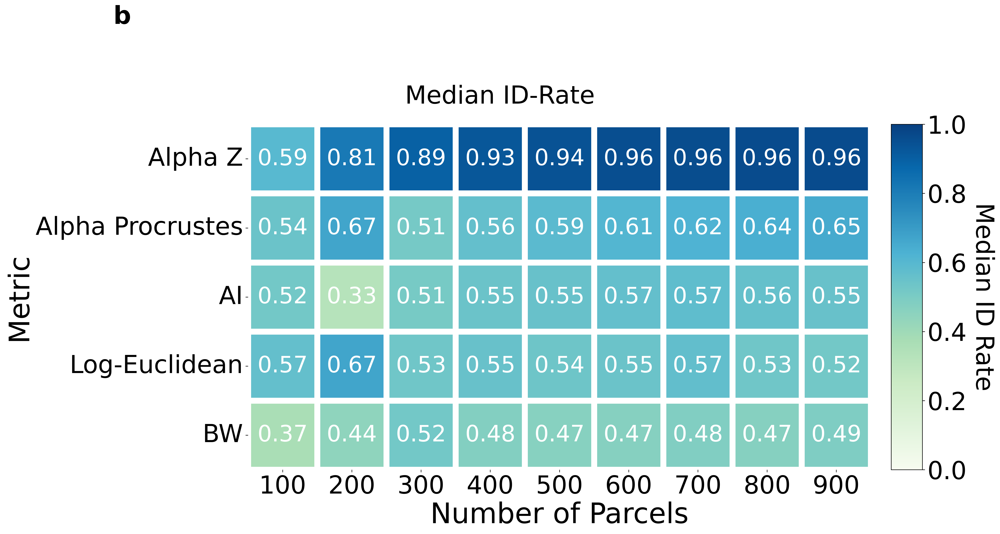

In [49]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from mpl_toolkits.axes_grid1 import make_axes_locatable
mpl.rcParams.update({
    'font.size':       18,
    'axes.titlesize':  40,
    'axes.labelsize':  35,
    'xtick.labelsize': 35,
    'ytick.labelsize': 35,
    'legend.fontsize': 20
})
# ─────────────────────────────────────────────────────────────────────
# 1. Your data and medians calculation (unchanged)
# ─────────────────────────────────────────────────────────────────────
data = [
    {'AI': [0.8820, 0.1238, 0.4019, 0.6787, 0.4603, 0.2909, 0.5806, 0.6904],
     'BW': [0.6881, 0.1484, 0.3411, 0.5199, 0.2360, 0.2886, 0.3949, 0.4579],
     'Log‐Euclidean': [0.8411, 0.2325, 0.4720, 0.7126, 0.5222, 0.3703, 0.6098, 0.6787],
     'Alpha Z': [0.7850, 0.3423, 0.5631, 0.7126, 0.4264, 0.5012, 0.6437, 0.6262],
     'Alpha Procrustes': [0.8423, 0.2336, 0.4755, 0.7114, 0.4860, 0.3914, 0.6040, 0.6636]},
    {'AI': [0.8984, 0.1133, 0.2523, 0.5561, 0.2652, 0.2839, 0.3680, 0.6682],
     'BW': [0.7862, 0.2009, 0.3972, 0.5935, 0.2815, 0.3598, 0.4907, 0.5444],
     'Log‐Euclidean': [0.9147, 0.1157, 0.5981, 0.8143, 0.6437, 0.4591, 0.6951, 0.7675],
     'Alpha Z': [0.9264, 0.5666, 0.8072, 0.8890, 0.6939, 0.7547, 0.8283, 0.8213],
     'Alpha Procrustes': [0.9229, 0.1893, 0.6016, 0.8201, 0.6425, 0.4521, 0.6951, 0.7792]},
    {'AI': [0.8820, 0.2021, 0.4591, 0.6343, 0.2558, 0.4147, 0.5596, 0.5958],
     'BW': [0.8364, 0.2407, 0.4755, 0.6495, 0.3341, 0.4159, 0.5654, 0.6040],
     'Log‐Euclidean': [0.9357, 0.2105, 0.4451, 0.7255, 0.3832, 0.5140, 0.5456, 0.8107],
     'Alpha Z': [0.9591, 0.6694, 0.8867, 0.9498, 0.8341, 0.8668, 0.9147, 0.9030],
     'Alpha Procrustes': [0.9591, 0.2582, 0.4708, 0.6904, 0.3750, 0.4311, 0.5584, 0.8177]},
    {'AI': [0.9042, 0.2395, 0.5035, 0.6729, 0.2780, 0.4544, 0.5888, 0.5993],
     'BW': [0.8458, 0.2465, 0.3890, 0.6308, 0.3610, 0.4112, 0.5432, 0.6075],
     'Log‐Euclidean': [0.8949, 0.2266, 0.5023, 0.6612, 0.2745, 0.5417, 0.5643, 0.6624],
     'Alpha Z': [0.9813, 0.7196, 0.9159, 0.9579, 0.8879, 0.8995, 0.9439, 0.9369],
     'Alpha Procrustes': [0.8925, 0.2780, 0.5140, 0.6811, 0.3808, 0.4708, 0.6121, 0.6484]},
    {'AI': [0.9171, 0.2605, 0.5012, 0.6904, 0.2944, 0.4743, 0.6075, 0.6180],
     'BW': [0.8400, 0.2453, 0.3890, 0.6308, 0.3750, 0.4030, 0.5304, 0.6063],
     'Log‐Euclidean': [0.8902, 0.2488, 0.4871, 0.6787, 0.2803, 0.4661, 0.5841, 0.5935],
     'Alpha Z': [0.9883, 0.7383, 0.9322, 0.9661, 0.9077, 0.9124, 0.9521, 0.9533],
     'Alpha Procrustes': [0.8376, 0.3026, 0.5397, 0.6998, 0.4112, 0.4988, 0.6355, 0.6659]},
    {'AI': [0.9299, 0.2617, 0.5082, 0.7044, 0.2956, 0.4790, 0.6238, 0.6343],
     'BW': [0.8563, 0.2605, 0.3949, 0.6355, 0.3843, 0.4019, 0.5397, 0.6098],
     'Log‐Euclidean': [0.9077, 0.2406, 0.5082, 0.6892, 0.2850, 0.4509, 0.5829, 0.6262],
     'Alpha Z': [0.9918, 0.7605, 0.9486, 0.9650, 0.9241, 0.9241, 0.9638, 0.9661],
     'Alpha Procrustes': [0.8563, 0.3213, 0.5666, 0.7150, 0.4357, 0.5035, 0.6577, 0.6951]},
    {'AI': [0.9241, 0.2769, 0.5140, 0.6998, 0.3026, 0.4953, 0.6355, 0.6355],
     'BW': [0.8423, 0.2664, 0.4019, 0.6390, 0.3984, 0.4217, 0.5397, 0.6016],
     'Log‐Euclidean': [0.9077, 0.2523, 0.5175, 0.6986, 0.2827, 0.4836, 0.6192, 0.6379],
     'Alpha Z': [0.9942, 0.7664, 0.9509, 0.9731, 0.9381, 0.9322, 0.9708, 0.9685],
     'Alpha Procrustes': [0.8598, 0.3563, 0.5818, 0.7255, 0.4544, 0.5327, 0.6624, 0.6986]},
    {'AI': [0.9346, 0.2792, 0.4895, 0.7009, 0.3026, 0.4930, 0.6285, 0.6402],
     'BW': [0.8493, 0.2500, 0.3820, 0.6262, 0.3995, 0.4042, 0.5409, 0.5853],
     'Log‐Euclidean': [0.9159, 0.2488, 0.4603, 0.6764, 0.2757, 0.4673, 0.5912, 0.6402],
     'Alpha Z': [0.9965, 0.7745, 0.9533, 0.9755, 0.9404, 0.9381, 0.9731, 0.9731],
     'Alpha Procrustes': [0.8598, 0.3657, 0.5923, 0.7430, 0.4673, 0.5432, 0.6822, 0.7114]},
    {'AI': [0.9404, 0.2780, 0.4860, 0.7056, 0.3095, 0.4825, 0.6215, 0.6659],
     'BW': [0.8493, 0.2547, 0.4007, 0.6308, 0.4206, 0.4334, 0.5479, 0.5806],
     'Log‐Euclidean': [0.9194, 0.2395, 0.4322, 0.6810, 0.2512, 0.4521, 0.5923, 0.6507],
     'Alpha Z': [0.9977, 0.7979, 0.9603, 0.9778, 0.9439, 0.9416, 0.9685, 0.9778],
     'Alpha Procrustes': [0.8738, 0.3797, 0.6145, 0.7558, 0.4953, 0.5654, 0.6928, 0.7255]}
]

metrics = [ 'Alpha Z', 'Alpha Procrustes','AI', 'Log‐Euclidean', 'BW']
parcels = [100, 200, 300, 400, 500, 600, 700, 800, 900]

# Compute median ID‐rate for each metric × parcel
medians = np.zeros((len(metrics), len(parcels)))
for i, m in enumerate(metrics):
    for j, entry in enumerate(data):
        medians[i, j] = np.median(entry[m])

# ─────────────────────────────────────────────────────────────────────
# 2. Create the heatmap with seaborn, but turn off the default gridlines
# ─────────────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(20, 12), dpi=300)
fig.patch.set_facecolor('white')

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.4)

sns.heatmap(
    medians,
    ax=ax,
    cmap='GnBu',
    vmin=0.0,
    vmax=1.0,
    annot=True,
    fmt=".2f",
    annot_kws={"size": 32, "color": "white"},
    linewidths=8,
    linecolor='white',
    square=True,
    cbar=False
)

cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap='GnBu', norm=plt.Normalize(0, 1)),
    cax=cax
)
cbar.set_label("Median ID Rate", rotation=270, labelpad=40, fontsize=35)

# ─────────────────────────────────────────────────────────────────────
# 3. Put the ticks and labels in their proper places
# ─────────────────────────────────────────────────────────────────────
# X‐axis: parcels
ax.set_xticks(np.arange(len(parcels)) + 0.5)
ax.set_xticklabels(parcels, rotation=0, fontsize=35)
ax.set_xlabel("Number of Parcels", fontsize=40)

# Y‐axis: metrics
ax.set_yticks(np.arange(len(metrics)) + 0.5)
ax.set_yticklabels(metrics, rotation=0, fontsize=35)
ax.set_ylabel("Metric", fontsize=40)

# ─────────────────────────────────────────────────────────────────────
# 4. Now draw a short red line next to each metric name (on the left)
#    and a short red line below each parcel label (on the bottom)
# ─────────────────────────────────────────────────────────────────────

# 4a. Horizontal red “ticks” beside each metric label:
#     We'll use ax.get_yaxis_transform() so that x-coordinates are in axis-fraction units:
for i in range(len(metrics)):
    y_cell_center = i + 0.5
    # Draw a small horizontal line from x = -0.005 to x = 0 (axis-fraction),
    # i.e. just outside the left edge of the colored cell.
    ax.hlines(
        y=y_cell_center,
        xmin=-0.005,  # 0 is the left edge of the heatmap; -0.005 is just left of it
        xmax=0.0,
        transform=ax.get_yaxis_transform(),  # “y” in data coords, “x” in axis-fraction
        color='red',
        linewidth=2
    )

# 4b. Vertical red “ticks” below each parcel label:
#     We'll use ax.get_xaxis_transform() so that y-coordinates are in axis-fraction units:
for j in range(len(parcels)):
    x_cell_center = j + 0.5
    # Draw a small vertical line from y = 0 to y = -0.02 in axis-fraction,
    # i.e. just below the bottom edge of the colored cell.
    ax.vlines(
        x=x_cell_center,
        ymin=-0.3,  # just below the bottom of the heatmap
        ymax=0.0,    # the bottom edge of the heatmap
        transform=ax.get_xaxis_transform(),  # “x” in data coords, “y” in axis-fraction
        color='red',
        linewidth=10
    )
fig.text(0.12,0.94,"b", fontsize=35, fontweight="bold")

fig.suptitle("Median ID-Rate",fontsize=35,y=0.84)
# ─────────────────────────────────────────────────────────────────────
# 5. Finalize layout and save
# ─────────────────────────────────────────────────────────────────────
plt.tight_layout()
fig.savefig("D:/Research AU/figure4c.pdf", bbox_inches='tight')
fig.savefig("D:/Research AU/figure4c.svg", bbox_inches='tight')
plt.show


C:\Users\ksrru\AppData\Local\Temp\ipykernel_18100\3053899534.py:219: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,1,0.95])


<function matplotlib.pyplot.show(close=None, block=None)>

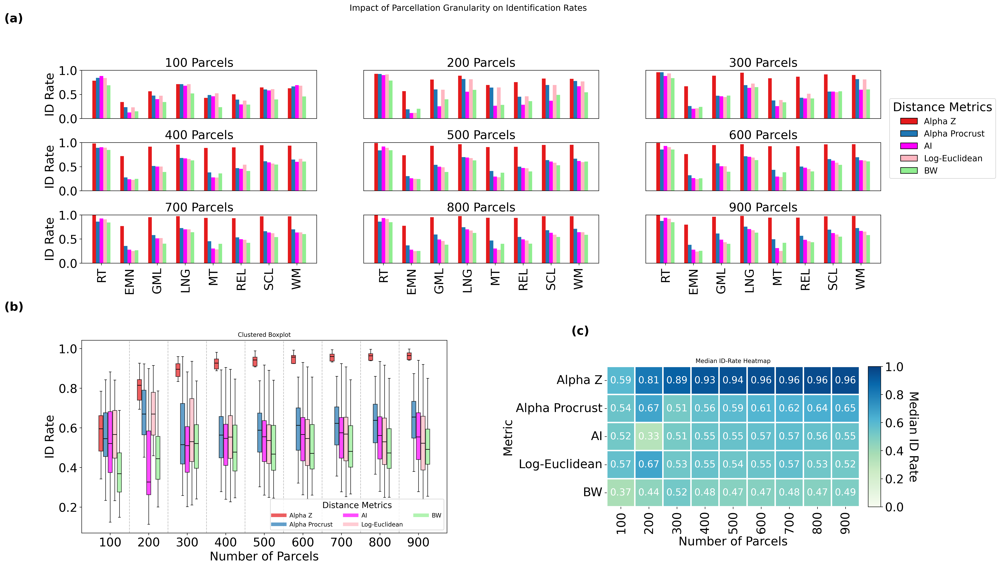

In [266]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.lines import Line2D
import matplotlib as mpl
from matplotlib.patches import Patch
# ─────────────────────────────────────────────────────────────────────────────
# 0) STYLE
# ─────────────────────────────────────────────────────────────────────────────
mpl.rcParams.update({
    'font.size':       13,
    'axes.titlesize': 20,
    'axes.labelsize':  20,
    'xtick.labelsize':  20,
    'ytick.labelsize':  20,
    'legend.fontsize':  20,
})

# ─────────────────────────────────────────────────────────────────────────────
# 1) DATA
# ─────────────────────────────────────────────────────────────────────────────
bar_data = [
    {'AI':             [0.8820,0.1238,0.4019,0.6787,0.4603,0.2909,0.5806,0.6904],
     'BW':             [0.6881,0.1484,0.3411,0.5199,0.2360,0.2886,0.3949,0.4579],
     'Log-Euclidean':  [0.8411,0.2325,0.4720,0.7126,0.5222,0.3703,0.6098,0.6787],
     'Alpha Z':        [0.7850,0.3423,0.5631,0.7126,0.4264,0.5012,0.6437,0.6262],
     'Alpha Procrust': [0.8423,0.2336,0.4755,0.7114,0.4860,0.3914,0.6040,0.6636]},
    {'AI':             [0.8984,0.1133,0.2523,0.5561,0.2652,0.2839,0.3680,0.6682],
     'BW':             [0.7862,0.2009,0.3972,0.5935,0.2815,0.3598,0.4907,0.5444],
     'Log-Euclidean':  [0.9147,0.1157,0.5981,0.8143,0.6437,0.4591,0.6951,0.7675],
     'Alpha Z':        [0.9264,0.5666,0.8072,0.8890,0.6939,0.7547,0.8283,0.8213],
     'Alpha Procrust': [0.9229,0.1893,0.6016,0.8201,0.6425,0.4521,0.6951,0.7792]},
    {'AI':             [0.8820,0.2021,0.4591,0.6343,0.2558,0.4147,0.5596,0.5958],
     'BW':             [0.8364,0.2407,0.4755,0.6495,0.3341,0.4159,0.5654,0.6040],
     'Log-Euclidean':  [0.9357,0.2105,0.4451,0.7255,0.3832,0.5140,0.5456,0.8107],
     'Alpha Z':        [0.9591,0.6694,0.8867,0.9498,0.8341,0.8668,0.9147,0.9030],
     'Alpha Procrust': [0.9591,0.2582,0.4708,0.6904,0.3750,0.4311,0.5584,0.8177]},
    {'AI':             [0.9042,0.2395,0.5035,0.6729,0.2780,0.4544,0.5888,0.5993],
     'BW':             [0.8458,0.2465,0.3890,0.6308,0.3610,0.4112,0.5432,0.6075],
     'Log-Euclidean':  [0.8949,0.2266,0.5023,0.6612,0.2745,0.5417,0.5643,0.6624],
     'Alpha Z':        [0.9813,0.7196,0.9159,0.9579,0.8879,0.8995,0.9439,0.9369],
     'Alpha Procrust': [0.8925,0.2780,0.5140,0.6811,0.3808,0.4708,0.6121,0.6484]},
    {'AI':             [0.9171,0.2605,0.5012,0.6904,0.2944,0.4743,0.6075,0.6180],
     'BW':             [0.8400,0.2453,0.3890,0.6308,0.3750,0.4030,0.5304,0.6063],
     'Log-Euclidean':  [0.8902,0.2488,0.4871,0.6787,0.2803,0.4661,0.5841,0.5935],
     'Alpha Z':        [0.9883,0.7383,0.9322,0.9661,0.9077,0.9124,0.9521,0.9533],
     'Alpha Procrust': [0.8376,0.3026,0.5397,0.6998,0.4112,0.4988,0.6355,0.6659]},
    {'AI':             [0.9299,0.2617,0.5082,0.7044,0.2956,0.4790,0.6238,0.6343],
     'BW':             [0.8563,0.2605,0.3949,0.6355,0.3843,0.4019,0.5397,0.6098],
     'Log-Euclidean':  [0.9077,0.2406,0.5082,0.6892,0.2850,0.4509,0.5829,0.6262],
     'Alpha Z':        [0.9918,0.7605,0.9486,0.9650,0.9241,0.9241,0.9638,0.9661],
     'Alpha Procrust': [0.8563,0.3213,0.5666,0.7150,0.4357,0.5035,0.6577,0.6951]},
    {'AI':             [0.9241,0.2769,0.5140,0.6998,0.3026,0.4953,0.6355,0.6355],
     'BW':             [0.8423,0.2664,0.4019,0.6390,0.3984,0.4217,0.5397,0.6016],
     'Log-Euclidean':  [0.9077,0.2523,0.5175,0.6986,0.2827,0.4836,0.6192,0.6379],
     'Alpha Z':        [0.9942,0.7664,0.9509,0.9731,0.9381,0.9322,0.9708,0.9685],
     'Alpha Procrust': [0.8598,0.3563,0.5818,0.7255,0.4544,0.5327,0.6624,0.6986]},
    {'AI':             [0.9346,0.2792,0.4895,0.7009,0.3026,0.4930,0.6285,0.6402],
     'BW':             [0.8493,0.2500,0.3820,0.6262,0.3995,0.4042,0.5409,0.5853],
     'Log-Euclidean':  [0.9159,0.2488,0.4603,0.6764,0.2757,0.4673,0.5912,0.6402],
     'Alpha Z':        [0.9965,0.7745,0.9533,0.9755,0.9404,0.9381,0.9731,0.9731],
     'Alpha Procrust': [0.8598,0.3657,0.5923,0.7430,0.4673,0.5432,0.6822,0.7114]},
    {'AI':             [0.9404,0.2780,0.4860,0.7056,0.3095,0.4825,0.6215,0.6659],
     'BW':             [0.8493,0.2547,0.4007,0.6308,0.4206,0.4334,0.5479,0.5806],
     'Log-Euclidean':  [0.9194,0.2395,0.4322,0.6810,0.2512,0.4521,0.5923,0.6507],
     'Alpha Z':        [0.9977,0.7979,0.9603,0.9778,0.9439,0.9416,0.9685,0.9778],
     'Alpha Procrust': [0.8738,0.3797,0.6145,0.7558,0.4953,0.5654,0.6928,0.7255]}
]

parcs   = [100,200,300,400,500,600,700,800,900]
tasks   = ['RT','EMN','GML','LNG','MT','REL','SCL','WM']

# MUST match your dict keys exactly:
methods = ["Alpha Z", "Alpha Procrust", "AI", "Log-Euclidean", "BW"]
metrics = methods.copy()

bar_colors = ['#e41a1c','#1f77b4','#ff00ff','#FFB6C1','#90EE90']

# Compute median‐matrix for the heatmap
medians = np.array([[np.median(d[m]) for d in bar_data] for m in metrics])

# ─────────────────────────────────────────────────────────────────────────────
# 2) FIGURE & OUTER GRID
# ─────────────────────────────────────────────────────────────────────────────
fig = plt.figure(figsize=(24,14), dpi=300)
outer = fig.add_gridspec(2,2,
                         width_ratios=[2,1.5],
                         height_ratios=[1,1],
                         wspace=0.5, hspace=0.4)

# ─────────────────────────────────────────────────────────────────────────────
# 3a) PANEL (a): 3×3 BAR‐GRID ACROSS TOP ROW
bar_handles = [
    Patch(facecolor=bar_colors[i], edgecolor='black', label=methods[i])
    for i in range(len(methods))
]

# 3a) Panel (a): 3×3 bar‐grid spanning top row, tighter spacing
gsA = outer[0, :].subgridspec(3, 3, hspace=0.5, wspace=0.2)
bar_w = 0.13
x     = np.arange(len(tasks))

for idx in range(9):
    r, c = divmod(idx, 3)
    ax = fig.add_subplot(gsA[r, c])
    # draw bars
    for i, m in enumerate(methods):
        ax.bar(x + i*bar_w, bar_data[idx][m],
               width=bar_w, color=bar_colors[i])
    ax.set_title(f"{parcs[idx]} Parcels", fontsize=20)
    ax.set_ylim(0, 1)

    # only bottom‐row has xticks
    if r < 2:
        ax.set_xticks([])
    else:
        ax.set_xticks(x + 2*bar_w)
        ax.set_xticklabels(tasks, rotation=90, ha='center', fontsize=20)

    # only left‐col has yticks
    if c > 0:
        ax.set_yticks([])
    else:
        ax.set_ylabel("ID Rate", fontsize=20)

    # legend only in top‐right subplot (idx==2), placed just outside to the right
    if idx == 2:
        ax.legend(
            handles=bar_handles,
            loc='best',
            bbox_to_anchor=(1.02, 0.5),
            title="Distance Metrics",
            title_fontsize=20,
            fontsize=14,
            frameon=True
        )

fig.text(0.05, 0.96, "(a)", fontsize=20, fontweight="bold")
# ─────────────────────────────────────────────────────────────────────────────
# 3b) PANEL (b): CLUSTERED BOXPLOT BOTTOM‐LEFT
# ─────────────────────────────────────────────────────────────────────────────
axB = fig.add_subplot(outer[1,0])
width   = 0.12
x_base  = np.arange(len(parcs))
offsets = (np.arange(len(metrics)) - 2)*width

for i,m in enumerate(metrics):
    scores    = [d[m] for d in bar_data]
    positions = x_base + offsets[i]
    bp = axB.boxplot(scores,
                     positions=positions,
                     widths=width*0.9,
                     patch_artist=True,
                     showfliers=False,
                     medianprops=dict(color='black',linewidth=1),
                     whiskerprops=dict(color='black',linewidth=0.8),
                     capprops=dict(color='black',linewidth=0.8))
    for box in bp['boxes']:
        box.set_facecolor(bar_colors[i])
        box.set_alpha(0.7)

for j in x_base[:-1]:
    axB.axvline(j+0.5, linestyle='--', color='gray', linewidth=1, alpha=0.5)

axB.set_xticks(x_base)
axB.set_xticklabels(parcs, fontsize=20)
axB.set_xlabel("Number of Parcels", fontsize=20)
axB.set_ylabel("ID Rate", fontsize=20)
axB.set_title("Clustered Boxplot", fontsize=10)

# legend inside
handles = [Line2D([0],[0], color=bar_colors[i], lw=6, alpha=0.7)
           for i in range(len(methods))]
axB.legend(handles, methods,
           loc='lower right',
           fontsize=10,
           title="Distance Metrics",
           title_fontsize=14,
           ncol=3,
           frameon=True)

fig.text(0.05,0.48,"(b)", fontsize=20, fontweight="bold")

# ─────────────────────────────────────────────────────────────────────────────
# 3c) PANEL (c): HEATMAP BOTTOM‐RIGHT
# ─────────────────────────────────────────────────────────────────────────────
axC = fig.add_subplot(outer[1,1])
divider = make_axes_locatable(axC)
cax     = divider.append_axes("right", size="5%", pad=0.2)

sns.heatmap(medians,
            ax=axC,
            cmap='GnBu',
            vmin=0, vmax=1,
            annot=True, fmt=".2f",
            annot_kws={"size":16,"color":"white"},
            linewidths=2, linecolor='white',
            square=True, cbar=False)

cbar = fig.colorbar(plt.cm.ScalarMappable(norm=plt.Normalize(0,1),cmap='GnBu'),cax=cax)
cbar.set_label("Median ID Rate", rotation=270, labelpad=25, fontsize=20)

axC.set_xticks(np.arange(len(parcs))+0.5)
axC.set_xticklabels(parcs, fontsize=20,rotation=90)
axC.set_xlabel("Number of Parcels", fontsize=20)

axC.set_yticks(np.arange(len(metrics))+0.5)
axC.set_yticklabels(metrics, fontsize=20, rotation=0)
axC.set_ylabel("Metric", fontsize=20)
axC.set_title("Median ID‐Rate Heatmap", fontsize=10)

fig.text(0.60,0.44,"(c)", fontsize=20, fontweight="bold")

# ─────────────────────────────────────────────────────────────────────────────
# 4) FINALIZE
# ─────────────────────────────────────────────────────────────────────────────
fig.suptitle("Impact of Parcellation Granularity on Identification Rates",fontsize=14, y=0.99)
plt.tight_layout(rect=[0,0,1,0.95])
fig.savefig("D:/Research AU/figure4.pdf", bbox_inches='tight')
fig.savefig("D:/Research AU/figure4.svg", bbox_inches='tight')
plt.show



In [55]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib as mpl

# ─────────────────────────────────────────────────────────────────────────────
# 0) STYLE (bigger fonts, crisp)
# ─────────────────────────────────────────────────────────────────────────────
mpl.rcParams.update({
    'figure.dpi':           300,
    'figure.figsize':       (24, 34),
    'font.size':            16,
    'axes.titlesize':       40,
    'axes.labelsize':       35,
    'xtick.labelsize':      35,
    'ytick.labelsize':      35,
    'legend.fontsize':      35,
    'legend.title_fontsize':18,
})

# ─────────────────────────────────────────────────────────────────────────────
# 1) DATA — nine bar‐dicts (one per parcellation)
# ─────────────────────────────────────────────────────────────────────────────
bar_data = [
    {'AI': [0.8820,0.1238,0.4019,0.6787,0.4603,0.2909,0.5806,0.6904],
     'BW': [0.6881,0.1484,0.3411,0.5199,0.2360,0.2886,0.3949,0.4579],
     'Log-Euclidean': [0.8411,0.2325,0.4720,0.7126,0.5222,0.3703,0.6098,0.6787],
     'Alpha Z': [0.7850,0.3423,0.5631,0.7126,0.4264,0.5012,0.6437,0.6262],
     'Alpha Procrust': [0.8423,0.2336,0.4755,0.7114,0.4860,0.3914,0.6040,0.6636]},
    {'AI': [0.8984,0.1133,0.2523,0.5561,0.2652,0.2839,0.3680,0.6682],
     'BW': [0.7862,0.2009,0.3972,0.5935,0.2815,0.3598,0.4907,0.5444],
     'Log-Euclidean': [0.9147,0.1157,0.5981,0.8143,0.6437,0.4591,0.6951,0.7675],
     'Alpha Z': [0.9264,0.5666,0.8072,0.8890,0.6939,0.7547,0.8283,0.8213],
     'Alpha Procrust': [0.9229,0.1893,0.6016,0.8201,0.6425,0.4521,0.6951,0.7792]},
    {'AI': [0.8820,0.2021,0.4591,0.6343,0.2558,0.4147,0.5596,0.5958],
     'BW': [0.8364,0.2407,0.4755,0.6495,0.3341,0.4159,0.5654,0.6040],
     'Log-Euclidean': [0.9357,0.2105,0.4451,0.7255,0.3832,0.5140,0.5456,0.8107],
     'Alpha Z': [0.9591,0.6694,0.8867,0.9498,0.8341,0.8668,0.9147,0.9030],
     'Alpha Procrust': [0.9591,0.2582,0.4708,0.6904,0.3750,0.4311,0.5584,0.8177]},
    {'AI': [0.9042,0.2395,0.5035,0.6729,0.2780,0.4544,0.5888,0.5993],
     'BW': [0.8458,0.2465,0.3890,0.6308,0.3610,0.4112,0.5432,0.6075],
     'Log-Euclidean': [0.8949,0.2266,0.5023,0.6612,0.2745,0.5417,0.5643,0.6624],
     'Alpha Z': [0.9813,0.7196,0.9159,0.9579,0.8879,0.8995,0.9439,0.9369],
     'Alpha Procrust': [0.8925,0.2780,0.5140,0.6811,0.3808,0.4708,0.6121,0.6484]},
    {'AI': [0.9171,0.2605,0.5012,0.6904,0.2944,0.4743,0.6075,0.6180],
     'BW': [0.8400,0.2453,0.3890,0.6308,0.3750,0.4030,0.5304,0.6063],
     'Log-Euclidean': [0.8902,0.2488,0.4871,0.6787,0.2803,0.4661,0.5841,0.5935],
     'Alpha Z': [0.9883,0.7383,0.9322,0.9661,0.9077,0.9124,0.9521,0.9533],
     'Alpha Procrust': [0.8376,0.3026,0.5397,0.6998,0.4112,0.4988,0.6355,0.6659]},
    {'AI': [0.9299,0.2617,0.5082,0.7044,0.2956,0.4790,0.6238,0.6343],
     'BW': [0.8563,0.2605,0.3949,0.6355,0.3843,0.4019,0.5397,0.6098],
     'Log-Euclidean': [0.9077,0.2406,0.5082,0.6892,0.2850,0.4509,0.5829,0.6262],
     'Alpha Z': [0.9918,0.7605,0.9486,0.9650,0.9241,0.9241,0.9638,0.9661],
     'Alpha Procrust': [0.8563,0.3213,0.5666,0.7150,0.4357,0.5035,0.6577,0.6951]},
    {'AI': [0.9241,0.2769,0.5140,0.6998,0.3026,0.4953,0.6355,0.6355],
     'BW': [0.8423,0.2664,0.4019,0.6390,0.3984,0.4217,0.5397,0.6016],
     'Log-Euclidean': [0.9077,0.2523,0.5175,0.6986,0.2827,0.4836,0.6192,0.6379],
     'Alpha Z': [0.9942,0.7664,0.9509,0.9731,0.9381,0.9322,0.9708,0.9685],
     'Alpha Procrust': [0.8598,0.3563,0.5818,0.7255,0.4544,0.5327,0.6624,0.6986]},
    {'AI': [0.9346,0.2792,0.4895,0.7009,0.3026,0.4930,0.6285,0.6402],
     'BW': [0.8493,0.2500,0.3820,0.6262,0.3995,0.4042,0.5409,0.5853],
     'Log-Euclidean': [0.9159,0.2488,0.4603,0.6764,0.2757,0.4673,0.5912,0.6402],
     'Alpha Z': [0.9965,0.7745,0.9533,0.9755,0.9404,0.9381,0.9731,0.9731],
     'Alpha Procrust': [0.8598,0.3657,0.5923,0.7430,0.4673,0.5432,0.6822,0.7114]},
    {'AI': [0.9404,0.2780,0.4860,0.7056,0.3095,0.4825,0.6215,0.6659],
     'BW': [0.8493,0.2547,0.4007,0.6308,0.4206,0.4334,0.5479,0.5806],
     'Log-Euclidean': [0.9194,0.2395,0.4322,0.6810,0.2512,0.4521,0.5923,0.6507],
     'Alpha Z': [0.9977,0.7979,0.9603,0.9778,0.9439,0.9416,0.9685,0.9778],
     'Alpha Procrust': [0.8738,0.3797,0.6145,0.7558,0.4953,0.5654,0.6928,0.7255]},
]

parcs   = [100,200,300,400,500,600,700,800,900]
tasks   = ['RT','EMN','GML','LNG','MT','REL','SCL','WM']
methods = ["Alpha Z", "Alpha Procrust", "AI", "Log-Euclidean", "BW"]
colors  = ['#e41a1c','#1f77b4','#ff00ff','#FFB6C1','#90EE90']
#colors = ['#1f77b4','#ff7f0e','#2ca02c','#d62728','#9467bd']

# 1) Define your per‐metric color map
box_colors = {
    'AI':            '#1f77b4',
    'BW':            '#ff7f0e',
    'Log-Euclidean': '#2ca02c',
    'Alpha Z':       '#d62728',
    'Alpha Procrust':'#9467bd'
}
# median matrix for heatmap
medians = np.array([[np.median(d[m]) for d in bar_data] for m in methods])

# ─────────────────────────────────────────────────────────────────────────────
# 2) FIGURE & OUTER GRID: 3 rows × 1 col
# ─────────────────────────────────────────────────────────────────────────────
fig = plt.figure()
outer = fig.add_gridspec(3,1, height_ratios=[3,2,2], hspace=0.4)

# ─────────────────────────────────────────────────────────────────────────────
# PANEL (a): 3×3 bar grid in outer[0]
# ─────────────────────────────────────────────────────────────────────────────
bar_handles = [ Patch(facecolor=colors[i], edgecolor='black', label=methods[i])
                for i in range(len(methods)) ]
gsA = outer[0].subgridspec(3,3, hspace=0.5, wspace=0.2)
bar_w = 0.12
x     = np.arange(len(tasks))

for idx in range(9):
    r,c = divmod(idx,3)
    ax = fig.add_subplot(gsA[r,c])
    for i,m in enumerate(methods):
        ax.bar(x + i*bar_w, bar_data[idx][m],
               width=bar_w, color=colors[i], edgecolor='none')
    ax.set_ylim(0,1)
    ax.set_title(f"{parcs[idx]} Parcels", pad=8)
    # bottom‐row xticks
    if r<2:
        ax.set_xticks([])
    else:
        ax.set_xticks(x + 2*bar_w)
        ax.set_xticklabels(tasks, rotation=90, ha='right')
        ax.set_xlabel("Tasks")
    # first‐col yticks
    if c>0:
        ax.set_yticks([])
    else:
        ax.set_ylabel("ID Rate")
      
    # lighten spines
    for s in ax.spines.values():
        s.set_alpha(0.3)
    # legend in top‐right
    if idx == 5:
       ax.legend(
        handles=bar_handles,
        loc='center left',          # not "middle left"
        bbox_to_anchor=(1.01, 0.5),  # x=102% (just outside), y=50% (middle)
        title="Distance\n Metrics",
        title_fontsize=30,
        fontsize=16,
        frameon=True
        )


fig.text(0.04, 0.90, "(a)", fontsize=30, weight='bold')

# ─────────────────────────────────────────────────────────────────────────────
# PANEL (b): clustered boxplot in outer[1]
# ─────────────────────────────────────────────────────────────────────────────
axB = fig.add_subplot(outer[1,0])

width   = 0.12
x_base  = np.arange(len(parcs))
offsets = (np.arange(len(methods)) - (len(methods)-1)/2) * width

# draw one box‐cluster per metric
for i, m in enumerate(methods):
    scores    = [d[m] for d in bar_data]
    positions = x_base + offsets[i]
    bp = axB.boxplot(
        scores,
        positions=positions,
        widths=width*0.9,
        patch_artist=True,
        showfliers=False,
        medianprops=dict(color='black', linewidth=1.5),
        whiskerprops=dict(color='black', linewidth=1),
        capprops=dict(color='black', linewidth=1)
    )
    # now color each box by its metric name
    for box in bp['boxes']:
        box.set_facecolor(box_colors[m])
        box.set_alpha(0.7)

# draw the vertical separators
for j in x_base[:-1]:
    axB.axvline(j+0.5, color='gray', linestyle='--', alpha=0.5)

axB.set_ylim(0, 1) 
# ticks & labels
axB.set_xticks(x_base)
axB.set_xticklabels(parcs)
axB.set_xlabel("Number of Parcels")
axB.set_ylabel("ID Rate")
axB.set_title("Clustered ID-Rate")

# legend *inside* the boxplot
from matplotlib.lines import Line2D
handles = [
    Line2D([0],[0], color=box_colors[m], lw=6, alpha=0.7)
    for m in methods
]
axB.legend(
    handles, methods,
    loc='center left',
    ncol=1,
    title="Distance\n Metrics",
    title_fontsize=30,
    fontsize=16,
    bbox_to_anchor=(1.01, 0.5),
    frameon=True
)
fig.text(0.04, 0.56, "(b)", fontsize=30, weight='bold')
# ─────────────────────────────────────────────────────────────────────────────
# PANEL (c): heatmap in outer[2]
# ─────────────────────────────────────────────────────────────────────────────
axC = fig.add_subplot(outer[2])
divider = make_axes_locatable(axC)
cax     = divider.append_axes("right", size="6%", pad=0.3)

sns.heatmap(medians,
            ax=axC,
            cmap='GnBu',
            vmin=0, vmax=1,
            annot=True, fmt=".2f",
            annot_kws={"size":30,"color":"white"},
            linewidths=3, linecolor='white',
            square=True, cbar=False)
cbar = fig.colorbar(plt.cm.ScalarMappable(norm=plt.Normalize(0,1),
                                          cmap='GnBu'),
                    cax=cax)
cbar.set_label("Median ID Rate", rotation=270, labelpad=25, fontsize=35)

axC.set_xticks(np.arange(len(parcs))+0.5)
axC.set_xticklabels(parcs, rotation=0, ha='center')
axC.set_xlabel("Number of Parcels")
axC.set_yticks(np.arange(len(methods))+0.5)
#axC.set_yticklabels(methods)
axC.set_yticklabels(methods, fontsize=35, rotation=0)
axC.set_title("Median ID-Rate")

fig.text(0.04, 0.31, "(c)", fontsize=30, weight='bold')

# ─────────────────────────────────────────────────────────────────────────────
# SUPER TITLE & FINAL
# ─────────────────────────────────────────────────────────────────────────────
fig.suptitle("Impact of Parcellation Granularity\n on Identification Rates",
             fontsize=40, y=0.97)
#plt.tight_layout(rect=[0,0,1,0.975])
#plt.tight_layout(rect=[0,0,1,0.95])
fig.savefig("D:/Research AU/figure4.pdf", bbox_inches='tight')
fig.savefig("D:/Research AU/figure4.svg", bbox_inches='tight')
plt.show



<function matplotlib.pyplot.show(close=None, block=None)>

C:\Users\ksrru\AppData\Local\Temp\ipykernel_4476\362534065.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,1,0.97])


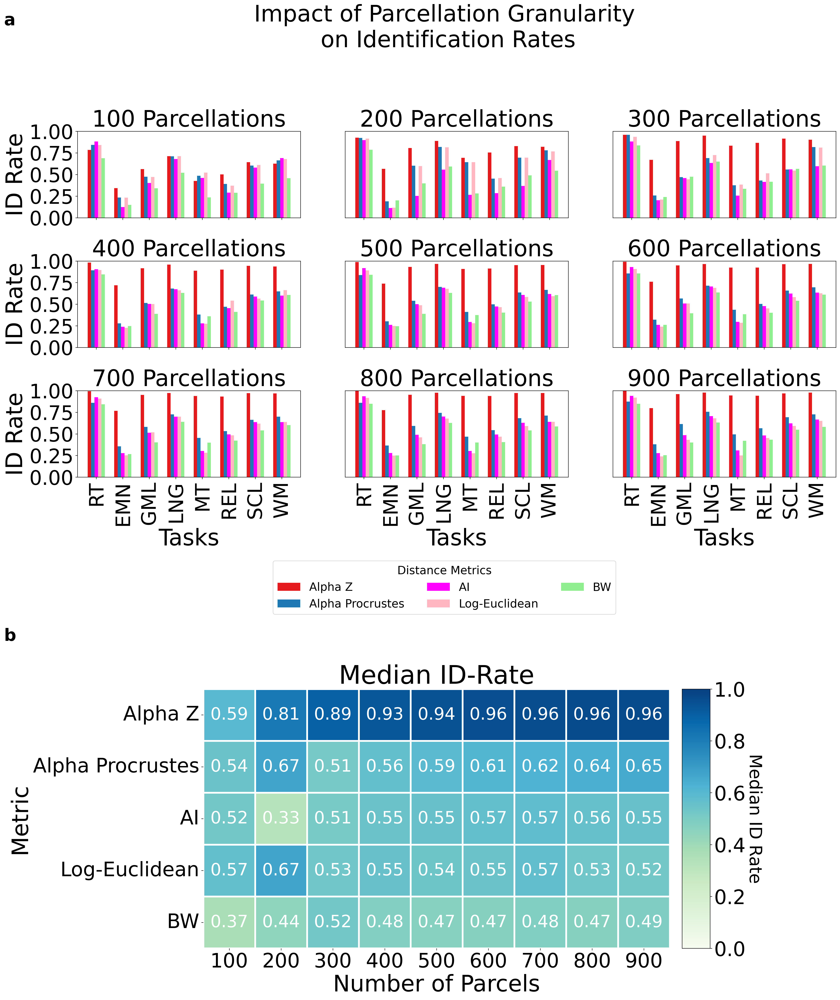

In [65]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl
import matplotlib.gridspec as gridspec
import seaborn as sns
from mpl_toolkits.axes_grid1 import make_axes_locatable

# ---- STYLE SETTINGS ----
mpl.rcParams.update({
    'font.size':        18,
    'axes.titlesize':   40,
    'axes.labelsize':   40,
    'xtick.labelsize':  35,
    'ytick.labelsize':  35,
    'legend.fontsize':  20
})

# ---- ALL PARCELLATION‐LEVEL BAR DATA (100–900) ----
data = [
    {'AI': [0.8820, 0.1238, 0.4019, 0.6787, 0.4603, 0.2909, 0.5806, 0.6904],
     'BW': [0.6881, 0.1484, 0.3411, 0.5199, 0.2360, 0.2886, 0.3949, 0.4579],
     'Log-Euclidean': [0.8411, 0.2325, 0.4720, 0.7126, 0.5222, 0.3703, 0.6098, 0.6787],
     'Alpha Z': [0.7850, 0.3423, 0.5631, 0.7126, 0.4264, 0.5012, 0.6437, 0.6262],
     'Alpha Procrustes': [0.8423, 0.2336, 0.4755, 0.7114, 0.4860, 0.3914, 0.6040, 0.6636]},
    {'AI': [0.8984, 0.1133, 0.2523, 0.5561, 0.2652, 0.2839, 0.3680, 0.6682],
     'BW': [0.7862, 0.2009, 0.3972, 0.5935, 0.2815, 0.3598, 0.4907, 0.5444],
     'Log-Euclidean': [0.9147, 0.1157, 0.5981, 0.8143, 0.6437, 0.4591, 0.6951, 0.7675],
     'Alpha Z': [0.9264, 0.5666, 0.8072, 0.8890, 0.6939, 0.7547, 0.8283, 0.8213],
     'Alpha Procrustes': [0.9229, 0.1893, 0.6016, 0.8201, 0.6425, 0.4521, 0.6951, 0.7792]},
    {'AI': [0.8820, 0.2021, 0.4591, 0.6343, 0.2558, 0.4147, 0.5596, 0.5958],
     'BW': [0.8364, 0.2407, 0.4755, 0.6495, 0.3341, 0.4159, 0.5654, 0.6040],
     'Log-Euclidean': [0.9357, 0.2105, 0.4451, 0.7255, 0.3832, 0.5140, 0.5456, 0.8107],
     'Alpha Z': [0.9591, 0.6694, 0.8867, 0.9498, 0.8341, 0.8668, 0.9147, 0.9030],
     'Alpha Procrustes': [0.9591, 0.2582, 0.4708, 0.6904, 0.3750, 0.4311, 0.5584, 0.8177]},
    {'AI': [0.9042, 0.2395, 0.5035, 0.6729, 0.2780, 0.4544, 0.5888, 0.5993],
     'BW': [0.8458, 0.2465, 0.3890, 0.6308, 0.3610, 0.4112, 0.5432, 0.6075],
     'Log-Euclidean': [0.8949, 0.2266, 0.5023, 0.6612, 0.2745, 0.5417, 0.5643, 0.6624],
     'Alpha Z': [0.9813, 0.7196, 0.9159, 0.9579, 0.8879, 0.8995, 0.9439, 0.9369],
     'Alpha Procrustes': [0.8925, 0.2780, 0.5140, 0.6811, 0.3808, 0.4708, 0.6121, 0.6484]},
    {'AI': [0.9171, 0.2605, 0.5012, 0.6904, 0.2944, 0.4743, 0.6075, 0.6180],
     'BW': [0.8400, 0.2453, 0.3890, 0.6308, 0.3750, 0.4030, 0.5304, 0.6063],
     'Log-Euclidean': [0.8902, 0.2488, 0.4871, 0.6787, 0.2803, 0.4661, 0.5841, 0.5935],
     'Alpha Z': [0.9883, 0.7383, 0.9322, 0.9661, 0.9077, 0.9124, 0.9521, 0.9533],
     'Alpha Procrustes': [0.8376, 0.3026, 0.5397, 0.6998, 0.4112, 0.4988, 0.6355, 0.6659]},
    {'AI': [0.9299, 0.2617, 0.5082, 0.7044, 0.2956, 0.4790, 0.6238, 0.6343],
     'BW': [0.8563, 0.2605, 0.3949, 0.6355, 0.3843, 0.4019, 0.5397, 0.6098],
     'Log-Euclidean': [0.9077, 0.2406, 0.5082, 0.6892, 0.2850, 0.4509, 0.5829, 0.6262],
     'Alpha Z': [0.9918, 0.7605, 0.9486, 0.9650, 0.9241, 0.9241, 0.9638, 0.9661],
     'Alpha Procrustes': [0.8563, 0.3213, 0.5666, 0.7150, 0.4357, 0.5035, 0.6577, 0.6951]},
    {'AI': [0.9241, 0.2769, 0.5140, 0.6998, 0.3026, 0.4953, 0.6355, 0.6355],
     'BW': [0.8423, 0.2664, 0.4019, 0.6390, 0.3984, 0.4217, 0.5397, 0.6016],
     'Log-Euclidean': [0.9077, 0.2523, 0.5175, 0.6986, 0.2827, 0.4836, 0.6192, 0.6379],
     'Alpha Z': [0.9942, 0.7664, 0.9509, 0.9731, 0.9381, 0.9322, 0.9708, 0.9685],
     'Alpha Procrustes': [0.8598, 0.3563, 0.5818, 0.7255, 0.4544, 0.5327, 0.6624, 0.6986]},
    {'AI': [0.9346, 0.2792, 0.4895, 0.7009, 0.3026, 0.4930, 0.6285, 0.6402],
     'BW': [0.8493, 0.2500, 0.3820, 0.6262, 0.3995, 0.4042, 0.5409, 0.5853],
     'Log-Euclidean': [0.9159, 0.2488, 0.4603, 0.6764, 0.2757, 0.4673, 0.5912, 0.6402],
     'Alpha Z': [0.9965, 0.7745, 0.9533, 0.9755, 0.9404, 0.9381, 0.9731, 0.9731],
     'Alpha Procrustes': [0.8598, 0.3657, 0.5923, 0.7430, 0.4673, 0.5432, 0.6822, 0.7114]},
    {'AI': [0.9404, 0.2780, 0.4860, 0.7056, 0.3095, 0.4825, 0.6215, 0.6659],
     'BW': [0.8493, 0.2547, 0.4007, 0.6308, 0.4206, 0.4334, 0.5479, 0.5806],
     'Log-Euclidean': [0.9194, 0.2395, 0.4322, 0.6810, 0.2512, 0.4521, 0.5923, 0.6507],
     'Alpha Z': [0.9977, 0.7979, 0.9603, 0.9778, 0.9439, 0.9416, 0.9685, 0.9778],
     'Alpha Procrustes': [0.8738, 0.3797, 0.6145, 0.7558, 0.4953, 0.5654, 0.6928, 0.7255]}
]

tasks   = ['RT', 'EMN', 'GML', 'LNG', 'MT', 'REL', 'SCL', 'WM']
methods = ['Alpha Z', 'Alpha Procrustes', 'AI', 'Log-Euclidean', 'BW']
titles  = [f'{100*(i+1)} Parcellations' for i in range(9)]
colors  = ['#e41a1c', '#1f77b4', '#ff00ff', '#FFB6C1', '#90EE90']

# ---- MEDIAN HEATMAP DATA ----
parcels = [100, 200, 300, 400, 500, 600, 700, 800, 900]

medians = np.zeros((len(methods), len(parcels)))
for i, m in enumerate(methods):
    for j, entry in enumerate(data):
        medians[i, j] = np.median(entry[m])

# ---- FIGURE SETUP ----
fig = plt.figure(figsize=(24, 26), dpi=300)
gs  = gridspec.GridSpec(2, 1, height_ratios=[4, 3], hspace=0.7)

# Panel (a): 3×3 bar grid
gs0 = gs[0].subgridspec(3, 3, hspace=0.5, wspace=0.2)
for idx in range(9):
    ax = fig.add_subplot(gs0[idx//3, idx%3])
    x  = np.arange(len(tasks))
    w  = 0.13
    for k, method in enumerate(methods):
        ax.bar(x + k*w, data[idx][method], width=w, color=colors[k],
               label=method if idx == 0 else "")
    ax.set_title(titles[idx])
    ax.set_xticks(x + 2*w)
    if idx//3 == 2:
        ax.set_xticklabels(tasks, rotation=90)
        ax.set_xlabel("Tasks")
    else:
        ax.set_xticklabels([])
    if idx%3 == 0:
        ax.set_ylabel("ID Rate")
        ax.set_yticks(np.linspace(0,1,5))
    else:
        ax.set_yticks([])
    ax.set_ylim(0,1)

legend = fig.legend(
    methods,
    loc='center',
    bbox_to_anchor=(.5, 0.45),
    ncol=3,
    title='Distance Metrics',
    title_fontsize=20
)
legend.get_frame().set_facecolor('white')
fig.suptitle("Impact of Parcellation Granularity\n on Identification Rates",
             fontsize=40, y=1)
fig.text(0.05, 0.98, "a", fontsize=30, weight='bold')

# Panel (b): heatmap
axh = fig.add_subplot(gs[1])
divider = make_axes_locatable(axh)
cax     = divider.append_axes("right", size="6%", pad=0.3)

sns.heatmap(medians,
            ax=axh,
            cmap='GnBu',
            vmin=0, vmax=1,
            annot=True, fmt=".2f",
            annot_kws={"size":30,"color":"white"},
            linewidths=3, linecolor='white',
            square=True, cbar=False)
cbar = fig.colorbar(
    plt.cm.ScalarMappable(norm=plt.Normalize(0,1), cmap='GnBu'),
    cax=cax
)
cbar.set_label("Median ID Rate", rotation=270, labelpad=30, fontsize=30)



axh.set_xticks(np.arange(len(parcels))+.5)
axh.set_xticklabels(parcels, rotation=0, fontsize=35)
axh.set_xlabel("Number of Parcels", fontsize=40)
axh.set_yticks(np.arange(len(methods))+.5)
axh.set_yticklabels(methods, rotation=0, fontsize=35)
axh.set_ylabel("Metric", fontsize=40)
axh.set_title("Median ID-Rate", fontsize=45)

# Red tick marks
for i in range(len(metrics)):
    axh.hlines(i, xmin=-0.01, xmax=-0.005,
               transform=axh.get_yaxis_transform(),
               color='red', linewidth=10)
for j in range(len(parcels)):
    axh.vlines(j, ymin=-0.01, ymax=-0.005,
               transform=axh.get_xaxis_transform(),
               color='red', linewidth=10)

fig.text(0.05, 0.4, "b", fontsize=30, weight='bold')

plt.tight_layout(rect=[0,0,1,0.97])
fig.savefig("D:/Research AU/figure4d1.pdf", bbox_inches='tight')
fig.savefig("D:/Research AU/figure4d1.svg", bbox_inches='tight')
plt.show()


In [484]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib as mpl

# ─────────────────────────────────────────────────────────────────────────────
# 0) STYLE (bigger fonts, crisp)
# ─────────────────────────────────────────────────────────────────────────────
mpl.rcParams.update({
    'font.size':            16,
    'axes.titlesize':       50,
    'axes.labelsize':       35,
    'xtick.labelsize':      45,
    'ytick.labelsize':      45,
    'legend.fontsize':      35,
    'legend.title_fontsize':18,
})

# ─────────────────────────────────────────────────────────────────────────────
# 1) DATA — nine bar‐dicts (one per parcellation)
# ─────────────────────────────────────────────────────────────────────────────
bar_data = [
    {'AI': [0.8820,0.1238,0.4019,0.6787,0.4603,0.2909,0.5806,0.6904],
     'BW': [0.6881,0.1484,0.3411,0.5199,0.2360,0.2886,0.3949,0.4579],
     'Log-Euclidean': [0.8411,0.2325,0.4720,0.7126,0.5222,0.3703,0.6098,0.6787],
     'Alpha Z': [0.7850,0.3423,0.5631,0.7126,0.4264,0.5012,0.6437,0.6262],
     'Alpha Procrust': [0.8423,0.2336,0.4755,0.7114,0.4860,0.3914,0.6040,0.6636]},
    {'AI': [0.8984,0.1133,0.2523,0.5561,0.2652,0.2839,0.3680,0.6682],
     'BW': [0.7862,0.2009,0.3972,0.5935,0.2815,0.3598,0.4907,0.5444],
     'Log-Euclidean': [0.9147,0.1157,0.5981,0.8143,0.6437,0.4591,0.6951,0.7675],
     'Alpha Z': [0.9264,0.5666,0.8072,0.8890,0.6939,0.7547,0.8283,0.8213],
     'Alpha Procrust': [0.9229,0.1893,0.6016,0.8201,0.6425,0.4521,0.6951,0.7792]},
    {'AI': [0.8820,0.2021,0.4591,0.6343,0.2558,0.4147,0.5596,0.5958],
     'BW': [0.8364,0.2407,0.4755,0.6495,0.3341,0.4159,0.5654,0.6040],
     'Log-Euclidean': [0.9357,0.2105,0.4451,0.7255,0.3832,0.5140,0.5456,0.8107],
     'Alpha Z': [0.9591,0.6694,0.8867,0.9498,0.8341,0.8668,0.9147,0.9030],
     'Alpha Procrust': [0.9591,0.2582,0.4708,0.6904,0.3750,0.4311,0.5584,0.8177]},
    {'AI': [0.9042,0.2395,0.5035,0.6729,0.2780,0.4544,0.5888,0.5993],
     'BW': [0.8458,0.2465,0.3890,0.6308,0.3610,0.4112,0.5432,0.6075],
     'Log-Euclidean': [0.8949,0.2266,0.5023,0.6612,0.2745,0.5417,0.5643,0.6624],
     'Alpha Z': [0.9813,0.7196,0.9159,0.9579,0.8879,0.8995,0.9439,0.9369],
     'Alpha Procrust': [0.8925,0.2780,0.5140,0.6811,0.3808,0.4708,0.6121,0.6484]},
    {'AI': [0.9171,0.2605,0.5012,0.6904,0.2944,0.4743,0.6075,0.6180],
     'BW': [0.8400,0.2453,0.3890,0.6308,0.3750,0.4030,0.5304,0.6063],
     'Log-Euclidean': [0.8902,0.2488,0.4871,0.6787,0.2803,0.4661,0.5841,0.5935],
     'Alpha Z': [0.9883,0.7383,0.9322,0.9661,0.9077,0.9124,0.9521,0.9533],
     'Alpha Procrust': [0.8376,0.3026,0.5397,0.6998,0.4112,0.4988,0.6355,0.6659]},
    {'AI': [0.9299,0.2617,0.5082,0.7044,0.2956,0.4790,0.6238,0.6343],
     'BW': [0.8563,0.2605,0.3949,0.6355,0.3843,0.4019,0.5397,0.6098],
     'Log-Euclidean': [0.9077,0.2406,0.5082,0.6892,0.2850,0.4509,0.5829,0.6262],
     'Alpha Z': [0.9918,0.7605,0.9486,0.9650,0.9241,0.9241,0.9638,0.9661],
     'Alpha Procrust': [0.8563,0.3213,0.5666,0.7150,0.4357,0.5035,0.6577,0.6951]},
    {'AI': [0.9241,0.2769,0.5140,0.6998,0.3026,0.4953,0.6355,0.6355],
     'BW': [0.8423,0.2664,0.4019,0.6390,0.3984,0.4217,0.5397,0.6016],
     'Log-Euclidean': [0.9077,0.2523,0.5175,0.6986,0.2827,0.4836,0.6192,0.6379],
     'Alpha Z': [0.9942,0.7664,0.9509,0.9731,0.9381,0.9322,0.9708,0.9685],
     'Alpha Procrust': [0.8598,0.3563,0.5818,0.7255,0.4544,0.5327,0.6624,0.6986]},
    {'AI': [0.9346,0.2792,0.4895,0.7009,0.3026,0.4930,0.6285,0.6402],
     'BW': [0.8493,0.2500,0.3820,0.6262,0.3995,0.4042,0.5409,0.5853],
     'Log-Euclidean': [0.9159,0.2488,0.4603,0.6764,0.2757,0.4673,0.5912,0.6402],
     'Alpha Z': [0.9965,0.7745,0.9533,0.9755,0.9404,0.9381,0.9731,0.9731],
     'Alpha Procrust': [0.8598,0.3657,0.5923,0.7430,0.4673,0.5432,0.6822,0.7114]},
    {'AI': [0.9404,0.2780,0.4860,0.7056,0.3095,0.4825,0.6215,0.6659],
     'BW': [0.8493,0.2547,0.4007,0.6308,0.4206,0.4334,0.5479,0.5806],
     'Log-Euclidean': [0.9194,0.2395,0.4322,0.6810,0.2512,0.4521,0.5923,0.6507],
     'Alpha Z': [0.9977,0.7979,0.9603,0.9778,0.9439,0.9416,0.9685,0.9778],
     'Alpha Procrust': [0.8738,0.3797,0.6145,0.7558,0.4953,0.5654,0.6928,0.7255]},
]

parcs   = [100,200,300,400,500,600,700,800,900]
methods = ["Alpha Z", "Alpha Procrust", "AI", "Log-Euclidean", "BW"]

box_colors = {
    'AI':            '#1f77b4',
    'BW':            '#ff7f0e',
    'Log-Euclidean': '#2ca02c',
    'Alpha Z':       '#d62728',
    'Alpha Procrust':'#9467bd'
}

# compute medians
medians = np.array([[np.median(d[m]) for d in bar_data] for m in methods])

# ─────────────────────────────────────────────────────────────────────────────
# 2) CREATE FIGURE WITH constrained_layout
# ─────────────────────────────────────────────────────────────────────────────
fig, (axB, axC) = plt.subplots(
    2, 1,
    figsize=(24, 28),
    dpi=300,
    constrained_layout=True,
    gridspec_kw={
        "height_ratios": [4, 2.5],
        "hspace": 0.1
    }
)

# ─────────────────────────────────────────────────────────────────────────────
# PANEL (a): clustered boxplot on axB
# ─────────────────────────────────────────────────────────────────────────────
width   = 0.12
x_base  = np.arange(len(parcs))
offsets = (np.arange(len(methods)) - (len(methods)-1)/2) * width

for i, m in enumerate(methods):
    scores    = [d[m] for d in bar_data]
    positions = x_base + offsets[i]
    bp = axB.boxplot(
        scores,
        positions=positions,
        widths=width*0.9,
        patch_artist=True,
        showfliers=False,
        medianprops=dict(color='black', linewidth=1.5),
        whiskerprops=dict(color='black', linewidth=1),
        capprops=dict(color='black', linewidth=1)
    )
    for box in bp['boxes']:
        box.set_facecolor(box_colors[m])
        box.set_alpha(0.7)

# separators & labels
for j in x_base[:-1]:
    axB.axvline(j+0.5, color='gray', linestyle='--', alpha=0.5)

axB.set_ylim(0, 1)
axB.set_xticks(x_base)
axB.set_xticklabels(parcs)
axB.set_xlabel("Number of Parcels", fontsize=45)
axB.set_ylabel("ID Rate", fontsize=45)
fig.text(0.15, 1.03, "a", fontsize=40, weight='bold')

# legend below
handles = [Line2D([0],[0], color=box_colors[m], lw=14, alpha=0.7) for m in methods]
axB.legend(
    handles, methods,
    loc='center left',
    ncol=3,
    title="Distance Metrics",
    title_fontsize=40,
    fontsize=35,
    bbox_to_anchor=(.2, -.25),
    frameon=True
)
# ─────────────────────────────────────────────────────────────────────────────
# PANEL (b): heatmap on axC
# ─────────────────────────────────────────────────────────────────────────────
divider = make_axes_locatable(axC)
cax     = divider.append_axes("right", size="6%", pad=0.4)

sns.heatmap(
    medians,
    ax=axC,
    cmap='GnBu',
    vmin=0, vmax=1,
    annot=True, fmt=".2f",
    annot_kws={"size":35,"color":"white"},
    linewidths=8, linecolor='white',
    square=True, cbar=False
)
cbar = fig.colorbar(
    plt.cm.ScalarMappable(norm=plt.Normalize(0,1), cmap='GnBu'),
    cax=cax
)
cbar.set_label("Median ID Rate", rotation=270, labelpad=45, fontsize=45)

axC.set_xticks(np.arange(len(parcs))+0.5)
axC.set_xticklabels(parcs, rotation=0, ha='center')
axC.set_xlabel("Number of Parcels", fontsize=45)
axC.set_yticks(np.arange(len(methods))+0.5)
axC.set_yticklabels(methods, fontsize=45, rotation=0)
axC.set_ylabel("Metric", fontsize=45)
axC.set_title("Median ID-Rate", fontsize=50)
fig.text(0.15, 0.35, "b", fontsize=40, weight='bold')

# ─────────────────────────────────────────────────────────────────────────────
# SUPER TITLE
# ─────────────────────────────────────────────────────────────────────────────
fig.suptitle(
    "Impact of Parcellation Granularity\n on Identification Rates",
    fontsize=50, x=0.55, y=1.08,ha='center', va='top'
)
fig.savefig("D:/Research AU/figure4e.pdf", bbox_inches='tight')
fig.savefig("D:/Research AU/figure4e.svg", bbox_inches='tight')
plt.show()


# Figure 6

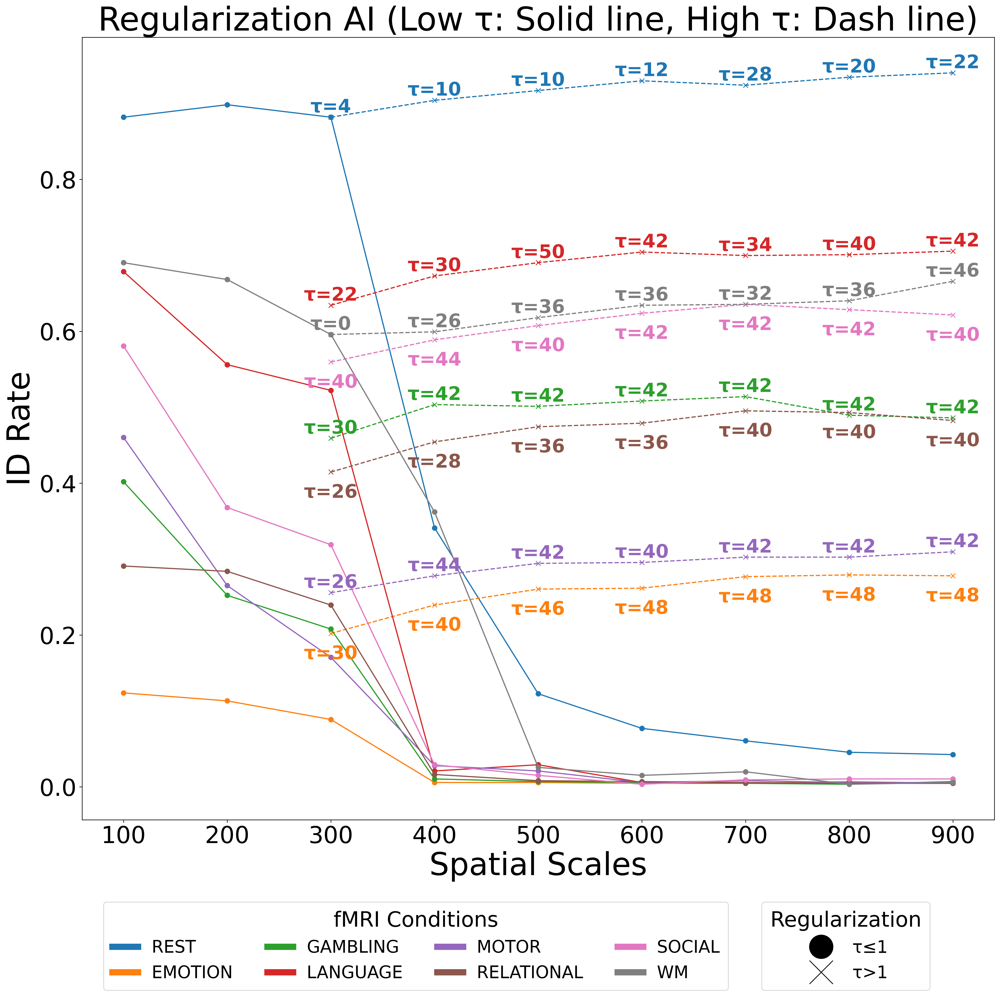

In [429]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

# ─── Style ────────────────────────────────────────────────────────────────
mpl.rcParams.update({
    'font.size': 14,
    'axes.titlesize': 30,
    'axes.labelsize': 30,
    'xtick.labelsize': 30,
    'ytick.labelsize': 30,
    'legend.fontsize': 20
})

# ─── Data ─────────────────────────────────────────────────────────────────
task_data1 = {
    'REST':       [0.8820, 0.8984, 0.8820, 0.3411, 0.1227, 0.0771, 0.0607, 0.0456, 0.0426],
    'EMOTION':    [0.1238, 0.1133, 0.0888, 0.0058, 0.0058, 0.0047, 0.0047, 0.0070, 0.0047],
    'GAMBLING':   [0.4019, 0.2523, 0.2079, 0.0105, 0.0070, 0.0058, 0.0047, 0.0035, 0.0070],
    'LANGUAGE':   [0.6787, 0.5561, 0.5222, 0.0210, 0.0292, 0.0058, 0.0058, 0.0047, 0.0047],
    'MOTOR':      [0.4603, 0.2652, 0.1706, 0.0280, 0.0210, 0.0058, 0.0082, 0.0058, 0.0058],
    'RELATIONAL': [0.2909, 0.2839, 0.2395, 0.0164, 0.0082, 0.0070, 0.0058, 0.0047, 0.0047],
    'SOCIAL':     [0.5806, 0.3680, 0.3189, 0.0292, 0.0152, 0.0035, 0.0093, 0.0105, 0.0105],
    'WM':         [0.6904, 0.6682, 0.5958, 0.3621, 0.0257, 0.0152, 0.0199, 0.0035, 0.0058]
}

task_data2 = {
    'REST':       [0.8820, 0.9042, 0.9171, 0.9299, 0.9241, 0.9346, 0.9404],
    'EMOTION':    [0.2021, 0.2395, 0.2605, 0.2617, 0.2769, 0.2792, 0.2780],
    'GAMBLING':   [0.4591, 0.5035, 0.5012, 0.5082, 0.5140, 0.4895, 0.4860],
    'LANGUAGE':   [0.6343, 0.6729, 0.6904, 0.7044, 0.6998, 0.7009, 0.7056],
    'MOTOR':      [0.2558, 0.2780, 0.2944, 0.2956, 0.3026, 0.3026, 0.3096],
    'RELATIONAL': [0.4147, 0.4544, 0.4743, 0.4790, 0.4953, 0.4930, 0.4825],
    'SOCIAL':     [0.5596, 0.5888, 0.6075, 0.6238, 0.6355, 0.6285, 0.6215],
    'WM':         [0.5958, 0.5993, 0.6180, 0.6343, 0.6355, 0.6402, 0.6659]
}

tau_values = {
    'REST':       [4, 10, 10, 12, 28, 20, 22],
    'EMOTION':    [30, 40, 46, 48, 48, 48, 48],
    'GAMBLING':   [30, 42, 42, 42, 42, 42, 42],
    'LANGUAGE':   [22, 30, 50, 42, 34, 40, 42],
    'MOTOR':      [26, 44, 42, 40, 42, 42, 42],
    'RELATIONAL': [26, 28, 36, 36, 40, 40, 40],
    'SOCIAL':     [40, 44, 40, 42, 42, 42, 40],
    'WM':         [0, 26, 36, 36, 32, 36, 46]
}

parcels1 = [100, 200, 300, 400, 500, 600, 700, 800, 900]
parcels2 = [300, 400, 500, 600, 700, 800, 900]
# ─── Plot ──────────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(18, 16), dpi=300)

for task, color in task_colors.items():
    d1 = task_data1[task]
    d2 = task_data2[task]
    ax.plot(parcels1, d1, marker='o', linestyle='-', color=color)
    ax.plot(parcels2, d2, marker='x', linestyle='--', color=color)
    for x, y, t in zip(parcels2, d2, tau_values[task]):
        if task in ('SOCIAL', 'RELATIONAL','EMOTION'):
            y -= .04
        ax.annotate(
            f"τ={t}", xy=(x, y), xytext=(0, 6), textcoords='offset points',
            ha='center', fontsize=24, fontweight='bold', color=color,
            #bbox=dict(boxstyle="round,pad=0.15", fc="white", alpha=0.6)
        )

ax.set_xlabel("Spatial Scales",fontsize=40)
ax.set_ylabel("ID Rate",fontsize=40)
ax.set_title("Regularization AI (Low τ: Solid line, High τ: Dash line)",fontsize=42)

# ─── Prepare legend handles ───────────────────────────────────────────────

# prepare handles exactly as before
cond_handles = [plt.Line2D([0], [0], color=col, lw=8) for col in task_colors.values()]
cond_labels  = list(task_colors.keys())
reg_handles  = [
    plt.Line2D([0], [0], marker='o', color='black', linestyle='',markersize=30, label='τ≤1'),
    plt.Line2D([0], [0], marker='x', color='black', linestyle='', markersize=30,label='τ>1')
]

# make room on the right
plt.tight_layout(rect=[0, 0, 1, 1])

# legend 1: Conditions (top)
fig.legend(
    cond_handles, cond_labels,
    title="fMRI Conditions",
    title_fontsize=27,
    fontsize=22,
    ncol=4,
    frameon=True,
    borderpad=0.5,
    handlelength=1.5,
    loc="upper left",
    bbox_to_anchor=(.1, 0),
    bbox_transform=fig.transFigure
)

# legend 2: Regularization (below)
fig.legend(
    reg_handles,
    ["τ≤1", "τ>1"],
    title="Regularization",
    title_fontsize=27,
    fontsize=22,
    ncol=1,
    frameon=True,
    borderpad=0.5,
    loc="upper left",
    bbox_to_anchor=(.75, 0),
    bbox_transform=fig.transFigure
)
fig.savefig("D:/Research AU/figure6a.svg", bbox_inches='tight')
fig.savefig("D:/Research AU/figure6a.pdf", bbox_inches='tight')
plt.show()


# Figure 7

C:\Users\ksrru\AppData\Local\Temp\ipykernel_4476\4200007332.py:148: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(methods, rotation=0, fontsize=25)
C:\Users\ksrru\AppData\Local\Temp\ipykernel_4476\4200007332.py:148: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(methods, rotation=0, fontsize=25)
C:\Users\ksrru\AppData\Local\Temp\ipykernel_4476\4200007332.py:148: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(methods, rotation=0, fontsize=25)


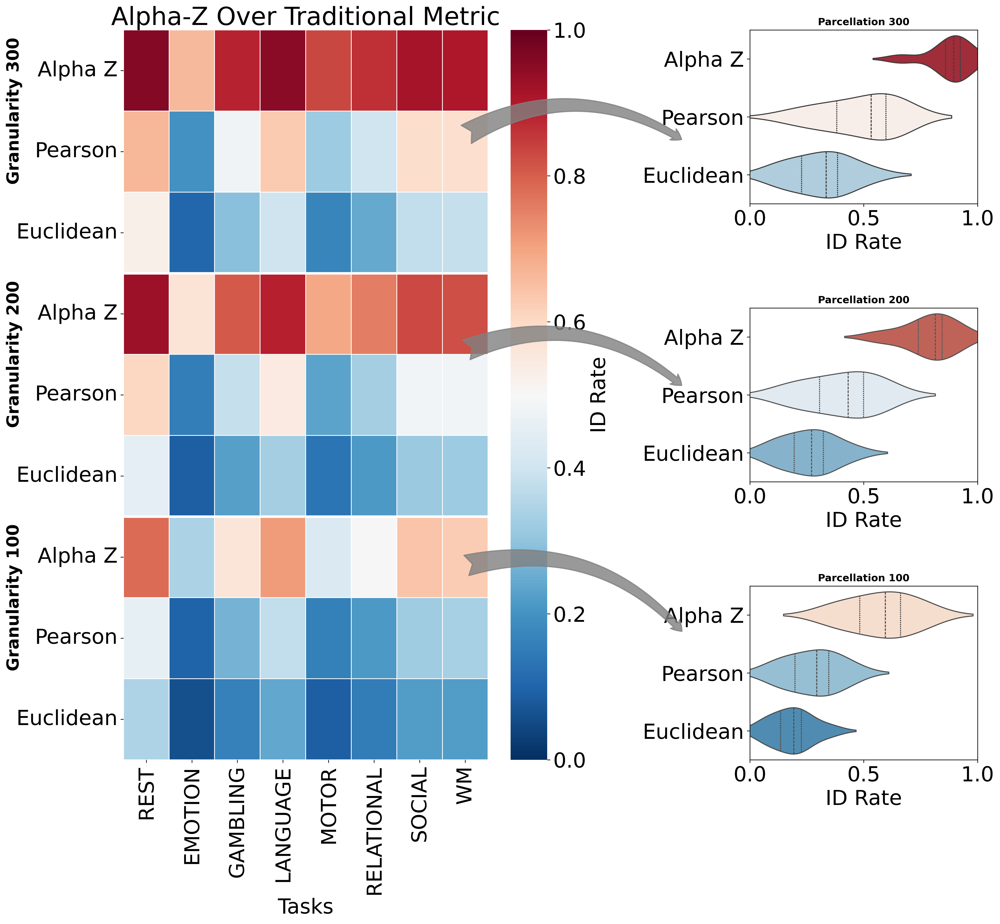

In [89]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec
from matplotlib.colors import Normalize
from matplotlib.patches import FancyArrowPatch
mpl.rcParams.update({
    'font.size': 14,
    'axes.titlesize': 30,
    'axes.labelsize': 25,
    'xtick.labelsize': 25,
    'ytick.labelsize': 25,
    'legend.fontsize': 18
})

# --------------------------------------------------------
# 1. Define raw data & labels
# --------------------------------------------------------
tasks = ['REST', 'EMOTION', 'GAMBLING', 'LANGUAGE',
         'MOTOR', 'RELATIONAL', 'SOCIAL', 'WM']
methods = ['Alpha Z', 'Pearson', 'Euclidean']
parcels = ['100', '200', '300']

# Each block is shape (3 metrics × 8 tasks) in [Alpha Z, Pearson, Euclidean] order
data_100 = np.array([
    [0.7850, 0.3423, 0.5631, 0.7126, 0.4264, 0.5011, 0.6437, 0.6262],  # Alpha Z
    [0.4533, 0.0958, 0.2629, 0.3773, 0.1565, 0.2114, 0.3236, 0.3353],  # Pearson
    [0.3458, 0.0607, 0.1636, 0.2418, 0.0876, 0.1507, 0.2208, 0.2208]   # Euclidean
])

data_200 = np.array([
    [0.9264, 0.5666, 0.8072, 0.8890, 0.6939, 0.7547, 0.8283, 0.8213],  # Alpha Z
    [0.6075, 0.1530, 0.3797, 0.5456, 0.2336, 0.3294, 0.4825, 0.4836],  # Pearson
    [0.4498, 0.0888, 0.2255, 0.3318, 0.1343, 0.2138, 0.3154, 0.3189]   # Euclidean
])

data_300 = np.array([
    [0.9591, 0.6640, 0.8867, 0.9498, 0.8341, 0.8668, 0.9147, 0.9030],  # Alpha Z
    [0.6671, 0.1963, 0.4790, 0.6308, 0.3189, 0.4019, 0.5864, 0.5853],  # Pearson
    [0.5280, 0.1051, 0.2921, 0.3960, 0.1706, 0.2453, 0.3773, 0.3808]   # Euclidean
])

all_data = [data_100, data_200, data_300]

# --------------------------------------------------------
# 2. Stack the blocks to form a 9×8 heatmap matrix
# --------------------------------------------------------
stacked = np.vstack([data_300, data_200, data_100])  # shape = (9, 8)

# Build row labels “300_Alpha Z”, “300_Pearson”, “300_Euclidean”, then “200_…”, then “100_…”
row_labels = []
for parc, block in zip(['300', '200', '100'], [data_300, data_200, data_100]):
    for m in methods:
        row_labels.append(f"{m}")

df_heat = pd.DataFrame(stacked, index=row_labels, columns=tasks)

# --------------------------------------------------------
# 3. Create a figure with GridSpec: left heatmap, right violin plots
# --------------------------------------------------------
fig = plt.figure(figsize=(16,14), dpi=300)
gs = GridSpec(nrows=3, ncols=2,
              width_ratios=[2, 1],
              height_ratios=[1, 1, 1],
              wspace=0.5, hspace=0.6,
              figure=fig)

# Left column: a single large heatmap
ax_heat = fig.add_subplot(gs[:, 0])

# Right column: three small violin plot axes (one per parcel)
ax_violin_300 = fig.add_subplot(gs[0, 1])
ax_violin_200 = fig.add_subplot(gs[1, 1])
ax_violin_100 = fig.add_subplot(gs[2, 1])
ax_violins = [ax_violin_300, ax_violin_200, ax_violin_100]

# --------------------------------------------------------
# 4. Draw the heatmap using Normalize(0,1) and cmap="RdBu_r"
# --------------------------------------------------------
cmap = plt.get_cmap("RdBu_r")
norm_heat = Normalize(vmin=0.0, vmax=1.0)

sns.heatmap(
    df_heat,
    ax=ax_heat,
    cmap=cmap,
    norm=norm_heat,
    cbar_kws={"label": "ID Rate"},
    linewidths=0.5,
    linecolor="white"
)
ax_heat.set_title("Alpha-Z Over Traditional Metric", fontsize=30,y=1)
ax_heat.set_xlabel("Tasks")
#ax_heat.set_ylabel("Parcel × Method")

# Draw thick white separators at y = 3 and y = 6
for sep in [3, 6]:
    ax_heat.hlines(
        y=sep,
        xmin=0, xmax=len(tasks),
        color='white',
        linewidth=3,
        clip_on=False
    )

# Label each block (“Parc 300”, “Parc 200”, “Parc 100”) on the left margin
for idx, (start, end) in enumerate([(0, 3), (3, 6), (6, 9)]):
    y_center = (start + end - 1) / 2
    parcel = parcels[2 - idx]
    ax_heat.text(
        -0.3, y_center,
        f"Granularity {parcel}",
        va='center', ha='center',
        fontsize=20, fontweight='bold',
        rotation=90,
        transform=ax_heat.get_yaxis_transform()
    )

# --------------------------------------------------------
# 5. Build small horizontal violin plots on the right,
#    using the same color mapping as before
# --------------------------------------------------------
norm_bar = Normalize(vmin=0.0, vmax=1.0)

for ax, (parcel, block_data) in zip(ax_violins, zip(['300', '200', '100'], [data_300, data_200, data_100])):
    # block_data shape = (3 methods × 8 tasks)
    # Prepare a DataFrame for seaborn: 8 rows × 3 columns (each column = method)
    df_block = pd.DataFrame(block_data.T, columns=methods)
    
    # Compute medians for color mapping
    medians = np.median(block_data, axis=1)
    palette = {m: cmap(norm_bar(med)) for m, med in zip(methods, medians)}
    
    sns.violinplot(
        data=df_block,
        ax=ax,
        inner="quartile",
        palette=palette,
        orient='h'
    )
    ax.set_title(f"Parcellation {parcel}", fontsize=12, fontweight='bold')
    ax.set_xlim(0, 1.0)
    ax.set_xlabel("ID Rate")
    ax.set_ylabel("")  # no ylabel since methods are on y-axis

    # Rotate y-tick labels horizontally for readability
    ax.set_yticklabels(methods, rotation=0, fontsize=25)

# --------------------------------------------------------
# 6. Draw “fancy” arrows from the right‐edge of the heatmap blocks → violin plots
# --------------------------------------------------------
for i, (start, end) in enumerate([(0, 3), (3, 6), (6, 9)]):
    # Compute axes‐fraction start point (x=1.0, y = center fraction) for the heatmap
    y_med = (start + end - 1) / 2  # data‐coordinates
    disp_data = ax_heat.transData.transform((len(tasks), y_med))
    axes_frac = ax_heat.transAxes.inverted().transform(disp_data)
    x_start_ax, y_start_ax = 1.0, axes_frac[1]
    
    # Convert to figure fraction
    fig_start = fig.transFigure.inverted().transform(
        ax_heat.transAxes.transform((x_start_ax, y_start_ax))
    )
    
    # Violin plot side: a point just above the center (x = -0.05, y = 0.5) in axes fraction
    ax_v = ax_violins[i]
    disp_v = ax_v.transAxes.transform((-0.05, 0.5))
    fig_end = fig.transFigure.inverted().transform(disp_v)
    
    # Create a FancyArrowPatch
    arrow = FancyArrowPatch(
        posA=fig_start, posB=fig_end,
        connectionstyle="arc3,rad=-0.3",    # curve it slightly downward
        arrowstyle="Fancy, head_length=12, head_width=15, tail_width=25",
        color="gray",
        linewidth=1.5,
        alpha=0.8,
        transform=fig.transFigure
    )
    fig.add_artist(arrow)

# --------------------------------------------------------
# 7. Final adjustments
# --------------------------------------------------------
plt.subplots_adjust(left=.1, right=0.99, top=.92, bottom=0.05)
# Save if you want:
fig.savefig("D:/Research AU/figure7.pdf", bbox_inches='tight')
fig.savefig("D:/Research AU/figure7.svg", bbox_inches='tight')
plt.show()    # ← Note the parentheses

# figure 9

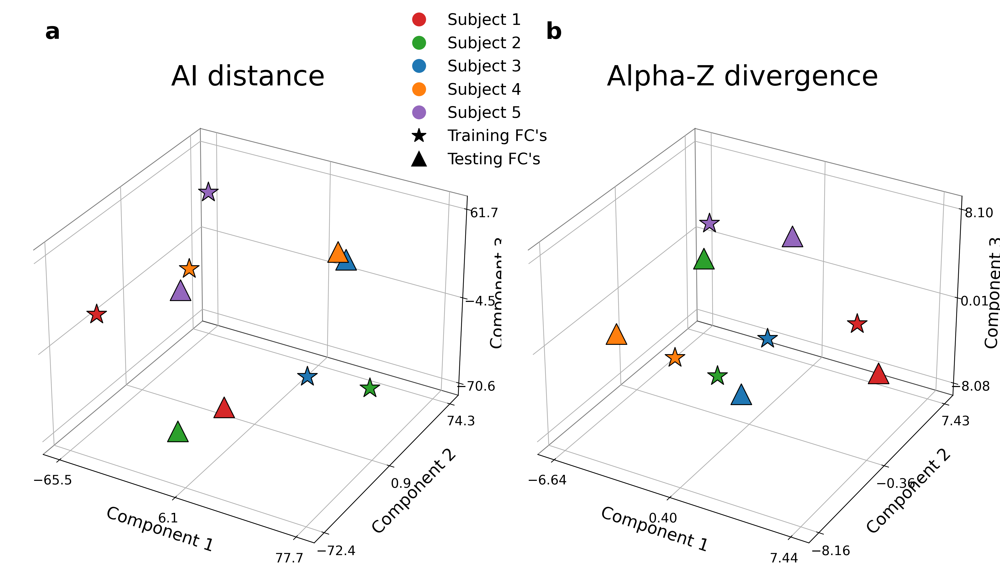

In [179]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from sklearn.manifold import MDS
from mpl_toolkits.mplot3d import Axes3D       # noqa: F401
from scipy.linalg import sqrtm, logm, fractional_matrix_power
from matplotlib.lines import Line2D

# ─── global style ────────────────────────────────────────────────────────────
mpl.rcParams.update({
    "font.family":     "sans-serif",
    "font.size":       12,
    "axes.titlesize":  16,
    "axes.labelsize":  18,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 17
})

# ─── helpers ──────────────────────────────────────────────────────────────────
def generate_file_paths(base_path, scan_type, num_subjects=5):
    paths = []
    for subj in sorted(os.listdir(base_path)):
        fp = os.path.join(base_path, subj, f"{subj}_rfMRI_REST1_{scan_type}_400")
        if os.path.exists(fp):
            paths.append(fp)
        if len(paths) >= num_subjects:
            break
    return paths

def load_connectivity_matrix(fp):
    try:
        M = np.loadtxt(fp, delimiter=" ")
        if M.ndim == 2 and M.shape[0] == M.shape[1] and np.allclose(M, M.T, atol=1e-8):
            return M
    except Exception:
        pass
    return None

def ai_distance(A, B):
    Ahalf = sqrtm(A)
    C     = np.linalg.inv(Ahalf) @ B @ np.linalg.inv(Ahalf)
    return np.linalg.norm(logm(C), "fro")

def alpha_z_bw(A, B, alpha=0.99, z=1.0):
    B1 = fractional_matrix_power(B, (1-alpha)/(2*z))
    A1 = fractional_matrix_power(A,    alpha/ z )
    B2 = fractional_matrix_power(B, (1-alpha)/(2*z))
    Q  = fractional_matrix_power(B1 @ A1 @ B2, z)
    return float(np.trace((1-alpha)*A + alpha*B) - np.trace(Q)).real

def pairwise_distance(mats, func):
    n = len(mats)
    D = np.zeros((n, n))
    for i in range(n):
        for j in range(i+1, n):
            D[i, j] = D[j, i] = func(mats[i], mats[j])
    return D

def tidy_3d_axes(ax, coords):
    ax.set_facecolor("white")
    ax.grid(True)
    mins, maxs = coords.min(axis=0), coords.max(axis=0)
    for setter, mn, mx in zip(
        (ax.set_xticks, ax.set_yticks, ax.set_zticks),
        mins, maxs
    ):
        setter(np.linspace(mn, mx, 3))
    for axis in (ax.xaxis, ax.yaxis, ax.zaxis):
        axis.pane.fill = False
        axis.pane.set_edgecolor("k")
        axis.pane.set_linewidth(.9)

def plot_3d_mds(ax, D, ids, title, subject_colors, marker_map):
    # embed
    mds    = MDS(n_components=3, dissimilarity="precomputed", random_state=42)
    coords = mds.fit_transform(D)

    for (x, y, z), full_id in zip(coords, ids):
        subj, scan = full_id.split("_")
        ax.scatter(
            x, y, z,
            color=subject_colors[subj],
            marker=marker_map[scan],
            s=500, edgecolor="k", linewidth=1
        )
        #ax.text(x, y, z, subj, fontsize=9,ha="center", va="center")

    ax.set_title(title, fontsize=30)
    ax.set_xlabel("Component 1")
    ax.set_ylabel("Component 2")
    ax.set_zlabel("Component 3")
    tidy_3d_axes(ax, coords)


# ─── MAIN ─────────────────────────────────────────────────────────────────────
if __name__ == "__main__":
    BASE_PATH = r"D:/Research AU/connectomes_400"

    lr_paths = generate_file_paths(BASE_PATH, "LR", 5)
    rl_paths = generate_file_paths(BASE_PATH, "RL", 5)

    raw_ids = (
        [f"{os.path.basename(p).split('_')[0]}_LR" for p in lr_paths] +
        [f"{os.path.basename(p).split('_')[0]}_RL" for p in rl_paths]
    )

    # label subjects "Subject 1"... in order of appearance
    uniq_subjs = sorted({rid.split("_")[0] for rid in raw_ids})
    label_map  = {sid: f"Subject {i+1}" for i, sid in enumerate(uniq_subjs)}

    full_ids, mats = [], []
    for fp, rid in zip(lr_paths + rl_paths, raw_ids):
        M = load_connectivity_matrix(fp)
        if M is not None:
            base, scan = rid.split("_")
            full_ids.append(f"{label_map[base]}_{scan}")
            mats.append(M)

    if not mats:
        raise RuntimeError("No valid matrices found – check BASE_PATH.")

    # compute distances
    D_ai   = pairwise_distance(mats, ai_distance)
    D_azbw = pairwise_distance(mats, alpha_z_bw)

    # prepare colors & markers
    # 5 distinct colors from tab10 for 5 subjects
    subject_palette = [
    "#D62728",  # red
    "#2CA02C",  # green
    "#1F77B4",  # blue
    "#FF7F0E",  # orange
    "#9467BD",  # purple
    ]
    subject_colors = {
    label_map[subj]: subject_palette[i]
    for i, subj in enumerate(uniq_subjs)
    }
    marker_map = {"LR": "*", "RL": "^"}

    # draw
    fig = plt.figure(figsize=(15, 10), dpi=300)
    ax1 = fig.add_subplot(1, 2, 1, projection="3d")
    ax2 = fig.add_subplot(1, 2, 2, projection="3d")

    plot_3d_mds(ax1, D_ai,   full_ids, "AI distance",            subject_colors, marker_map)
    plot_3d_mds(ax2, D_azbw, full_ids, "Alpha-Z divergence",    subject_colors, marker_map)

    # build legend handles
    subj_handles = [
        Line2D([0], [0], marker="o", color="w",
               markerfacecolor=subject_colors[label_map[s]], markersize=16,
               label=label_map[s])
        for s in uniq_subjs
    ]
    shape_handles = [
        Line2D([0], [0], marker=marker_map[scan], color="k", linestyle="None",
               markersize=16,
               label=("Training FC's" if scan=="LR" else "Testing FC's"))
        for scan in ("LR","RL")
    ]

    # combined legend
    fig.legend(
        handles=subj_handles + shape_handles,bbox_to_anchor=(0.48, 0.98),
        loc="upper center", ncol=1, frameon=False
    )

    # panel labels
    fig.text(0.05, 0.92, "a", fontsize=25,fontweight='bold')
    fig.text(0.55, 0.92, "b", fontsize=25,fontweight='bold')

    plt.tight_layout(rect=[0,0,1,0.96])
    fig.savefig("D:/Research AU/figure9a.pdf")
    fig.savefig("D:/Research AU/figure9a.svg")
    plt.show()


# Figure 9(b)

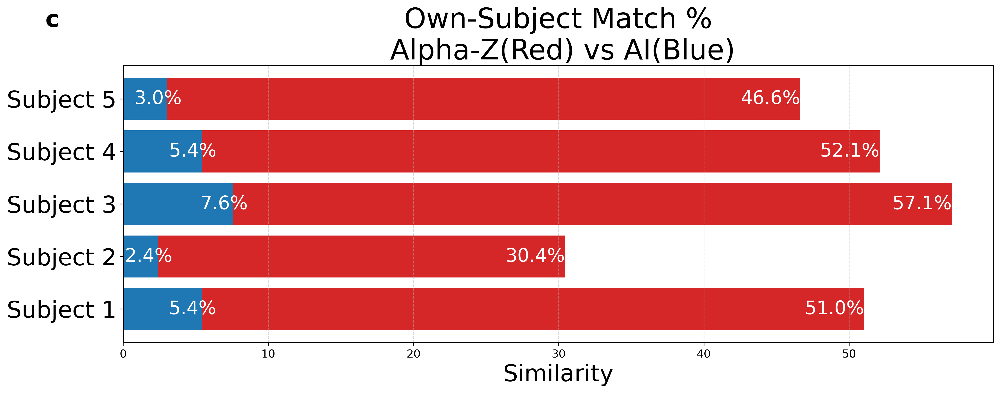

In [423]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data: own-subject match percentages for 5 subjects
subjects = [f"Subject {i+1}" for i in range(5)]
ai_percentages = np.array([5.43, 2.4, 7.59, 5.44, 3.04])
alpha_z_percentages = np.array([51.05, 30.43, 57.08, 52.1, 46.65])
mpl.rcParams.update({
    "font.family":     "sans-serif",
    "font.size":       12,
    "axes.titlesize":  16,
    "axes.labelsize":  14,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.fontsize": 12
})
# Set up the mirror bar plot
y = np.arange(len(subjects))

fig, ax = plt.subplots(figsize=(15, 6),dpi=300)
ax.barh(y, alpha_z_percentages, color='#d62728', label='Alpha-Z Divergence')
ax.barh(y, ai_percentages, color='#1f77b4', label='AI Distance')
# Add labels
for i in range(len(subjects)):
    ax.text(alpha_z_percentages[i] , y[i], f'{alpha_z_percentages[i]:.1f}%', va='center',ha='right', color='white',fontsize=20)
    ax.text(ai_percentages[i]+1 , y[i], f'{ai_percentages[i]:.1f}%', va='center', color='white', ha='right',fontsize=20)

# Formatting
ax.set_yticks(y)
ax.set_yticklabels(subjects, fontsize=25)
ax.set_xlabel('Similarity', fontsize=25)
ax.set_title('Own-Subject Match %\n Alpha-Z(Red) vs AI(Blue)', fontsize=30)
ax.axvline(0, color='black')
fig.text(0.05, 0.92, "c", fontsize=25,fontweight='bold')
plt.tight_layout()
plt.grid(axis='x', linestyle='--', alpha=0.5)
fig.savefig("D:/Research AU/figure9b.pdf")
fig.savefig("D:/Research AU/figure9b.svg")
plt.show()


In [ ]:
# Figure 10

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from math import pi
import matplotlib as mpl

# ---- STYLE SETTINGS FOR PUBLICATION ----
mpl.rcParams.update({
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.labelsize': 13,
    'xtick.labelsize': 11,
    'ytick.labelsize': 11,
    'legend.fontsize': 10
})

# ---- DATA PARSING FUNCTION ----
def parse_dataset(file_path, tasks_count):
    data = {}
    with open(file_path, 'r') as file:
        current_scale = None
        for line in file:
            line = line.strip()
            if line.startswith("#"):
                current_scale = line[1:].strip()
                data[current_scale] = {"Original": [], "Null": []}
            elif "Original ID Rate" in line:
                original_rate = float(line.split(":")[1].strip())
                data[current_scale]["Original"].append(original_rate)
            elif "Null Model ID Rate" in line:
                null_rate = float(line.split(":")[1].strip())
                data[current_scale]["Null"].append(null_rate)

    for scale in data:
        original_len = len(data[scale]["Original"])
        null_len = len(data[scale]["Null"])
        if original_len < tasks_count:
            data[scale]["Original"].extend([np.nan] * (tasks_count - original_len))
        if null_len < tasks_count:
            data[scale]["Null"].extend([np.nan] * (tasks_count - null_len))
    
    return data

# ---- PARAMETERS ----
file_path = 'D:/Research AU/Multi scale analysis of ID rate/ID_rate_null.txt'
tasks = ['Rest', 'Emotion', 'Gambling', 'Language', 'Motor', 'Relational', 'Social', 'Wm']
parsed_data = parse_dataset(file_path, len(tasks))
scales = list(parsed_data.keys())

# ---- RADAR PLOT SETUP ----

label_pad = 14        # outward shift for the task names (points)

fig, axes = plt.subplots(3, 3, subplot_kw=dict(polar=True),
                         figsize=(20, 12), dpi=300)
axes = axes.flatten()

angles = [n / float(len(tasks)) * 2 * np.pi for n in range(len(tasks))]
angles += angles[:1]                       # close the loop
fixed_ticks = np.arange(0, 1.1, 0.2)

for i, scale in enumerate(scales):
    original = parsed_data[scale]["Original"] + parsed_data[scale]["Original"][:1]
    null     = parsed_data[scale]["Null"]     + parsed_data[scale]["Null"][:1]

    ax = axes[i]
    ax.plot(angles, original, label='Original', linewidth=1.5, color='blue')
    ax.fill(angles, original, color='purple', alpha=0.15)
    ax.plot(angles, null,     label='Null',     linewidth=2.5, color='red')
    ax.fill(angles, null,     color='red',      alpha=0.30)

    # ----- tidy axis -----
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(tasks)
    ax.tick_params(axis='x', pad=label_pad)   # <— push labels outward
    ax.set_yticks(fixed_ticks)
    ax.set_ylim(0, 1)
    ax.set_rlabel_position(90)
    ax.set_title(scale)

    # Optional: rotate labels tangentially so they never overlap the plot
    for lbl, ang in zip(ax.get_xticklabels(), angles[:-1]):
        lbl.set_rotation(np.degrees(ang))     # tangential orientation
        # Adjust alignment so labels read naturally around the circle
        if 0 < ang < np.pi:
            lbl.set_horizontalalignment('left')
        else:
            lbl.set_horizontalalignment('right')

# -------------- figure‑level legend -------------------------------
legend_handles = [
    plt.Line2D([0], [0], color='blue', lw=6, label='Original'),
    plt.Line2D([0], [0], color='red',  lw=6, label='Null')
]
fig.legend(legend_handles, loc='center',
           bbox_to_anchor=(0.5, -0.1), ncol=2, frameon=False)

# -------------- layout tweaks -------------------------------------
plt.subplots_adjust(hspace=0.20, wspace=0.60, bottom=0.20)  # extra bottom for legend
#fig.savefig("D:/Research AU/figure10.pdf", bbox_inches='tight')
#fig.savefig("D:/Research AU/figure10.svg", bbox_inches='tight')
plt.show()

# figure 1(a)

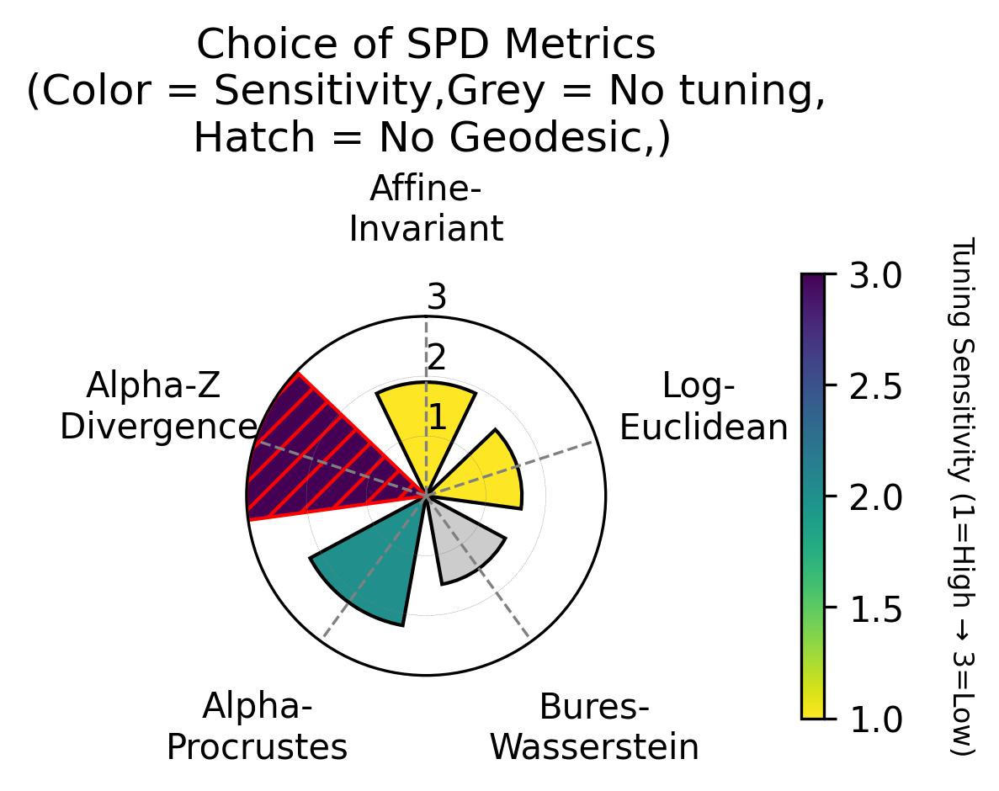

In [50]:
import matplotlib.pyplot as plt
import numpy as np

# Data
metrics = ["Affine-\nInvariant", "Log-\n Euclidean", "Bures-\nWasserstein", 
           "Alpha-\nProcrustes", "Alpha-Z\n Divergence"]
performance = np.array([1.9, 1.6, 1.5, 2.2, 3])  # 1–3 scale
sensitivity = np.array([1, 1, 0, 2, 3])  # 0 (No Need), 1,2,3
geodesic = np.array([1, 1, 1, 1, 0])      # 1=yes, 0=no
label_pad=20
# Angles
angles = np.linspace(0, 2 * np.pi, len(metrics), endpoint=False)
 
fig, ax = plt.subplots(figsize=(4, 3), subplot_kw={'polar': True},dpi=300)

# Color map with grey for no sensitivity (0)
cmap = plt.cm.viridis_r
norm = plt.Normalize(vmin=1, vmax=3)
colors = [cmap(norm(val)) if val > 0 else '#CCCCCC' for val in sensitivity]

bars = ax.bar(angles, performance, width=.9, color=colors, edgecolor='black')

# Annotation for no tuning
bw_idx = metrics.index("Bures-\nWasserstein")
angle = angles[bw_idx]
height = performance[bw_idx]
#ax.text(angle, height + 0.2, "No tuning", ha='center', va='bottom', fontsize=10, fontweight='bold')

# Hatch non-geodesic
for bar, g in zip(bars, geodesic):
    if g == 0:
        bar.set_hatch('///')
        bar.set_edgecolor('red')

# Grid and labels
ax.yaxis.grid(True, color='gray', linestyle='--', linewidth=0.1)
ax.xaxis.grid(True, color='gray', linestyle='--', linewidth=0.8)
ax.set_theta_offset(np.pi / 2)
ax.set_theta_direction(-1)
ax.set_thetagrids(angles * 180/np.pi, metrics)
ax.set_rlabel_position(360)
ax.tick_params(axis='x', pad=label_pad) 
ax.set_ylim(0, 3)

# Colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, pad=0.30,shrink=1)
#fig.text(0.05,0.95,"a", fontsize=12, fontweight="bold")
cbar.set_label('Tuning Sensitivity (1=High → 3=Low)', rotation=270, labelpad=20,fontsize=8)

ax.set_title(" Choice of SPD Metrics \n(Color = Sensitivity,Grey = No tuning,\n Hatch = No Geodesic,)")
plt.tight_layout()
fig.savefig("D:/Research AU/figure1a.pdf", bbox_inches='tight')
fig.savefig("D:/Research AU/figure1a.svg", bbox_inches='tight')
plt.show()


In [ ]:
# figure 1a

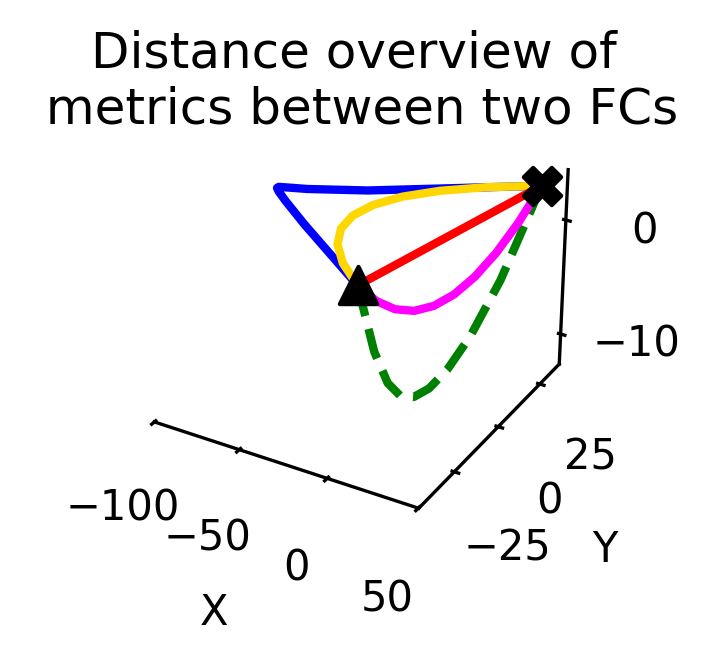

In [63]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.linalg import sqrtm, logm, expm, inv
from sklearn.decomposition import PCA

# Load your 400×400 FCs
P = np.loadtxt('D:/Research AU/connectomes_400/100206/100206_rfMRI_REST1_LR_400')[:400, :400]
Q = np.loadtxt('D:/Research AU/connectomes_400/100206/100206_rfMRI_REST1_RL_400')[:400, :400]


# precompute
sqrtP = sqrtm(P)
sqrtQ = sqrtm(Q)
inv_sqrtP = inv(sqrtP)

# corrected geodesics
def geodesic_ai(P, Q, t):
    # P^{1/2} (P^{-1/2} Q P^{-1/2})^t P^{1/2}
    M = inv_sqrtP @ Q @ inv_sqrtP
    return sqrtP @ expm(t * logm(M)) @ sqrtP

def geodesic_le(P, Q, t):
    return expm((1-t)*logm(P) + t*logm(Q))

def geodesic_bw(P, Q, t):
    # same as before
    M = sqrtm(inv_sqrtP @ Q @ inv_sqrtP)
    K = (1-t)*np.eye(P.shape[0]) + t*M
    return sqrtP @ K @ K @ sqrtP

def geodesic_procrustes(P, Q, t):
    # linear interp of square roots, then square back
    R_t = (1-t)*sqrtP + t*sqrtQ
    return R_t @ R_t

def geodesic_alpha_z(P, Q, t):
    return (1-t)*P + t*Q

# sample  t-values
t_vals = np.linspace(0,1,10)

# collect flattened mats
curves = {}
for name, f in [
    ('Affine-Invariant', geodesic_ai),
    ('Log-Euclidean',    geodesic_le),
    ('Bures-Wasserstein',geodesic_bw),
    ('Alpha-Procrustes',  geodesic_procrustes),
    ('Alpha-Z Divergence',geodesic_alpha_z),
]:
    mats = [f(P,Q,t) for t in t_vals]
    curves[name] = np.vstack([M.flatten() for M in mats])

# PCA to 3D
all_pts = np.vstack(list(curves.values()))
pca = PCA(3).fit(all_pts)
emb = {name: pca.transform(curves[name]) for name in curves}

# plot
fig = plt.figure(figsize=(8, 2), facecolor='white',dpi=300)
ax = fig.add_subplot(111, projection='3d', facecolor='white')
colors = {'Affine-Invariant':'blue','Log-Euclidean':'green',
          'Bures-Wasserstein':'gold','Alpha-Procrustes':'magenta',
          'Alpha-Z Divergence':'red'}
styles = {'Log-Euclidean':'--'}

for name, pts in emb.items():
    ax.plot(pts[:,0],pts[:,1],pts[:,2],
            color=colors[name],linestyle=styles.get(name,'-'),
            lw=2,label=name)

# endpoints
ends = pca.transform(np.vstack([P.flatten(),Q.flatten()]))
ax.scatter(*ends[0],c='k',marker='X',s=80,label='Training FC')
ax.scatter(*ends[1],c='k',marker='^',s=80,label='Testing FC')

ax.set_xlabel('X'); ax.set_ylabel('Y'); ax.set_zlabel('Z')
#ax.legend(loc='upper right')
ax.set_facecolor('white')
ax.xaxis.set_pane_color((1,1,1,0))
ax.yaxis.set_pane_color((1,1,1,0))
ax.zaxis.set_pane_color((1,1,1,0))
ax.set_title('Distance overview of\n metrics between two FCs', fontsize=12,y=.9)
ax.grid(False)
plt.tight_layout()
fig.savefig("D:/Research AU/figure1f.pdf", bbox_inches='tight')
fig.savefig("D:/Research AU/figure1f.svg", bbox_inches='tight')
plt.show()


In [ ]:
# Figure 1c

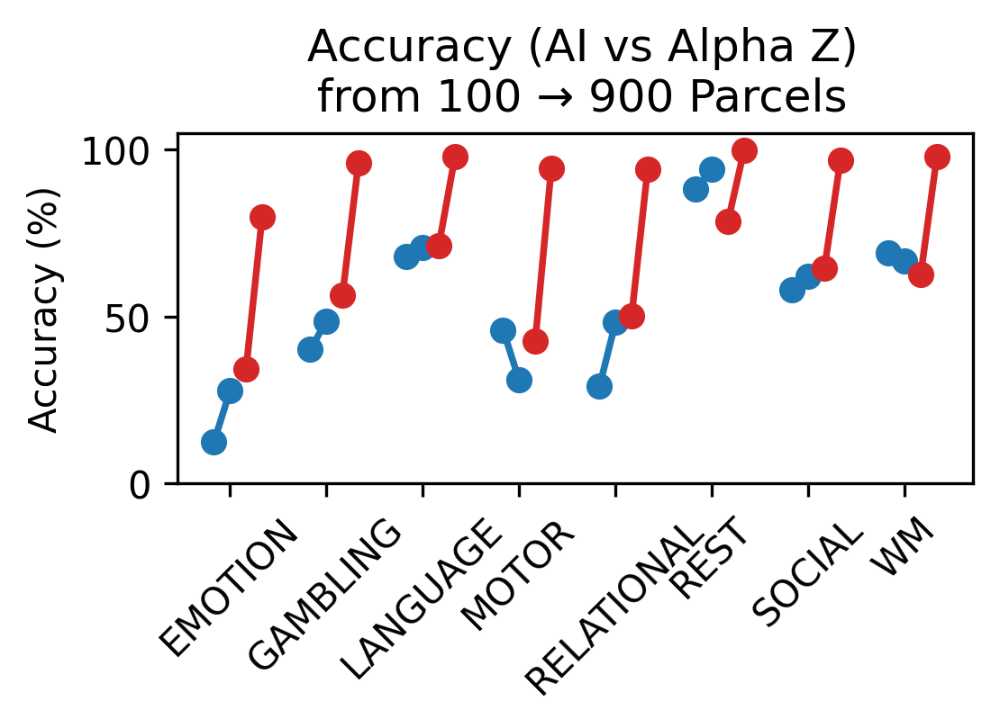

In [62]:
# Re-run necessary imports and regenerate everything after kernel reset
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.lines as mlines

# Raw accuracy data for 100 and 900 parcels
tasks_ai_distance = {
    'REST':       [0.8820, 0.9404],
    'EMOTION':    [0.1238, 0.2780],
    'GAMBLING':   [0.4019, 0.4860],
    'LANGUAGE':   [0.6787, 0.7056],
    'MOTOR':      [0.4603, 0.3096],
    'RELATIONAL': [0.2909, 0.4825],
    'SOCIAL':     [0.5806, 0.6215],
    'WM':         [0.6904, 0.6659]
}
tasks_alpha_z = {
    'REST':       [0.7850, 0.9977],
    'EMOTION':    [0.3423, 0.7979],
    'GAMBLING':   [0.5631, 0.9603],
    'LANGUAGE':   [0.7126, 0.9778],
    'MOTOR':      [0.4264, 0.9439],
    'RELATIONAL': [0.5011, 0.9416],
    'SOCIAL':     [0.6437, 0.9685],
    'WM':         [0.6262, 0.9778]
}

# Build DataFrame
records = []
for task, values in tasks_ai_distance.items():
    records.append({'Task': task, 'Metric': 'Affine-Invariant', 'Parcellation': 100, 'Score': values[0]*100})
    records.append({'Task': task, 'Metric': 'Affine-Invariant', 'Parcellation': 900, 'Score': values[1]*100})
for task, values in tasks_alpha_z.items():
    records.append({'Task': task, 'Metric': 'Alpha-Z', 'Parcellation': 100, 'Score': values[0]*100})
    records.append({'Task': task, 'Metric': 'Alpha-Z', 'Parcellation': 900, 'Score': values[1]*100})
df = pd.DataFrame(records)

# Rewriting the grouped dot plot with lines
fig, ax = plt.subplots(figsize=(3.8,2.8),dpi=300)
x_pos = []
colors = {'Affine-Invariant': '#1f77b4', 'Alpha-Z': '#d62728'}
lines_data = df.pivot_table(index=['Task', 'Metric'], columns='Parcellation', values='Score').reset_index()

for i, task in enumerate(sorted(df['Task'].unique())):
    for j, metric in enumerate(['Affine-Invariant', 'Alpha-Z']):
        row = lines_data[(lines_data['Task'] == task) & (lines_data['Metric'] == metric)]
        if not row.empty:
            y_100 = row[100].values[0]
            y_900 = row[900].values[0]
            xpos_100 = i * 3 + j * 1
            xpos_900 = xpos_100 + 0.5
            ax.plot([xpos_100, xpos_900], [y_100, y_900], color=colors[metric], linewidth=1.8)
            ax.plot(xpos_100, y_100, 'o', color=colors[metric])
            ax.plot(xpos_900, y_900, 'o', color=colors[metric])
            x_pos.append((xpos_100 + xpos_900) / 2)

ax.set_xticks([i * 3 + 0.5 for i in range(len(sorted(df['Task'].unique())))])
ax.set_xticklabels(sorted(df['Task'].unique()), rotation=45)
ai_line = mlines.Line2D([], [], color=colors['Affine-Invariant'], marker='o', label='Affine-Invariant')
az_line = mlines.Line2D([], [], color=colors['Alpha-Z'], marker='o', label='Alpha-Z')
#ax.legend(handles=[ai_line, az_line], title="Metric")
ax.set_ylabel("Accuracy (%)")
ax.set_ylim(0, 105)
ax.set_title(" Accuracy (AI vs Alpha Z)\n from 100 → 900 Parcels")
fig.tight_layout()


fig.savefig("D:/Research AU/figure1e.pdf", bbox_inches='tight')
fig.savefig("D:/Research AU/figure1e.svg", bbox_inches='tight')

plt.show()
